**Before Starting**: First, fill out the below code cell with your first name, last name, and student ID.

**Before Submission**: Make sure everything runs as expected. First, **restart the kernel** (in the menubar, select Kernel$\rightarrow$Restart) and then **run all cells** (in the menubar, select Cell$\rightarrow$Run All).


**During Lab Tips**:
1. DO NOT write your written responses in the same markdown cell as the question. If you do this, your written response will be lost!


2. DO NOT use outside datasets. Use ONLY the datasets linked in this lab. While outside datasets might work locally for YOU, code is likely to fail when being graded as outside datasets can be formatted differently.

**<font color='red'>NO TODO CHECKS</font>**

In [ ]:
FIRST_NAME = ""
LAST_NAME = ""
STUDENT_ID = ""

---

In [ ]:
# Uncomment this line if you are using a Google Colab!
# The below line will update fastai to the most recent version
# and install torchsummary!

!pip install -Uqq fastai==2.2.7 && pip install -Uqq torchsummary


# Convolutional Neural Networks and Data Augmentation



$
 \newcommand{\xv}{\mathbf{x}}
 \newcommand{\wv}{\mathbf{w}}
 \newcommand{\yv}{\mathbf{y}}
 \newcommand{\zv}{\mathbf{z}}
 \newcommand{\uv}{\mathbf{u}}
 \newcommand{\vv}{\mathbf{v}}
 \newcommand{\Chi}{\mathcal{X}}
 \newcommand{\R}{\rm I\!R}
 \newcommand{\sign}{\text{sign}}
 \newcommand{\Tm}{\mathbf{T}}
 \newcommand{\Xm}{\mathbf{X}}
 \newcommand{\Zm}{\mathbf{Z}}
 \newcommand{\I}{\mathbf{I}}
 \newcommand{\Um}{\mathbf{U}}
 \newcommand{\Vm}{\mathbf{V}}
 \newcommand{\muv}{\boldsymbol\mu}
 \newcommand{\Sigmav}{\boldsymbol\Sigma}
 \newcommand{\Lambdav}{\boldsymbol\Lambda}
$


## Goal

The goal of this week's lab is to introduce you to convolutional neural networks (CNNs) which are a variant of the original neural networks we saw last week. From here on, we will refer to these classical neural networks as either feedback forward or dense networks.

Along the way, we'll see how to build and use pre-train state of the are CNNs to improve our classification. Additionally, we will take a look at data augmentation which allows us to increase the size of our dataset and can help make our networks more robust to slight perturbations in the input. Additionally, we'll look at how we can use a special layer called Batch Normalization to regularize our CNNs and how we can use transfer learning to get start-of-the-art results in only a few training epochs!

## Agenda

- Improving MNIST Accuracy With CNNs
    - FastAI Data Loading
    - Building a CNN with PyTorch and Learning Using FastAI
    
- Classifying Dogs and Cats With CNNs
    - Loading the Pets Data
    - Building a CNN
    - Adding Special Layers: Batch Normalization
    - Exploring Training With Augmented Data
    - Transfer Learning With ResNet

## TODO Links

Note, these links do not work in colabs! Instead, use the table of contents to find TODOs when using a colab!

**Improving MNIST Accuracy With CNNs**
1. [TODO1 (2 points)](#TODO1)
2. [TODO2 (2 points)](#TODO2)
3. [TODO3 (10 points)](#TODO3)
4. [TODO4 (5 points)](#TODO4)  
5. [TODO5 (2 points)](#TODO5)

**Classifying Dogs and Cats With CNNs**

6. [TODO6 (10 points)](#TODO6)
7. [TODO7 (2 points)](#TODO7)
8. [TODO8 (5 points)](#TODO8)
9. [TODO9 (10 points)](#TODO9)
10. [TODO10 (15 points)](#TODO10)
11. [TODO11 (10 points)](#TODO11)
12. [TODO12 (5 points)](#TODO12)
13. [TODO13 (5 points)](#TODO13)
14. [TODO14 (5 points)](#TODO14)
15. [TODO15 (5 points)](#TODO15)
16. [TODO16 (5 points)](#TODO16)
**Feedback**

17. [Feedback (2 points)](#feedback)

In [ ]:
import warnings

import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import torch
from torchsummary import summary
# Set PyTorch to use CPU ONLY
# device = torch.device("cpu")
# torch.cuda.is_available = lambda : False

# Select which device PyTorch should use. If you have a gpu but
# want to use a the cpu only comment out this line and use the above
# lines instead.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

import fastai

if fastai.__version__ != '2.2.7':
    warnings.warn(f"Detected FastAI version {fastai.__version__} is 2.2.7,"
                  f" Please make sure you have the correct version otherwise erros may occur!")
# Set FastAI to use CPU ONLY as well if needed
# If use_cuda == None then GPU is used
# If use_cuda == True Error is thrown
# If use_cude == False CPU is used
# torch_core.defaults.use_cuda = False
from fastai.vision.all import *

In [ ]:
# Utility function for reseting our model's weights
def reset_model(model):
    for name, layer in model.named_children():
        if hasattr(layer, 'reset_parameters'):
            # print(name)
            layer.reset_parameters()

# Improving MNIST Accuracy With CNNs

To start off the lab, let's first see if we can improve on the classification accuracy our fully connected neural networks achieved last week by now using CNNs.

Recall, the [MNIST dataset](https://wiki.pathmind.com/mnist) is a classification dataset that contains handwritten digits and the goal is to classify each images as its intended number!

## FastAI Data Loading

To start out, like always, we need to first load our MNIST data using FastAI!

### Load Train and Validation Data

Let's quickly load our MNIST data from last week. This cell may take a few seconds to run as it is downloading the MNIST data from the web.

In [ ]:
path = untar_data(URLs.MNIST)
train_path, test_path = (path / 'training'), (path / 'testing')
print("File path for train data: {}".format(train_path))
print("File path for test data: {}".format(test_path))

File path for train data: /home/dev/.fastai/data/mnist_png/training
File path for test data: /home/dev/.fastai/data/mnist_png/testing


<div id="TODO1"></div>

#### TODO 1
Alright, so we have stored the `train_path` which holds all our train images and the `test_path` which holds all our test images for you. Now it's your turn, to load the MNIST data like we did in the previous lab using the FastAI `DataBlock` class.

1. Create a `DataBlock` class which takes as input the `ImageBlock(cls=PILImageBW)` instance, `CategoryBlock()` instance, a pointer to the `get_image_files` function, a `RandomSplitter` instance with a .2 validation split and the parameter seed set to 0, and a pointer to the `parent_label` function. Store the output into `mnist_db`.
    1. If you are stuck, refer to last weeks lab! We are making the `DataBlock` exactly like last week!
2. Load the train data using the `.dataloaders()` method and pass a batch size of 256. Store the output into `trn_vld_dls`.

In [ ]:
# TODO 1.1


In [ ]:
# TODO 1.2


Now, let's confirm our data loaded with a 80/20 split by printing out the train and valid datasets below. You should see that the `train_ds` has ~48k samples and the `valid_ds` has ~12k samples.

In [ ]:
trn_vld_dls.train_ds

(#48000) [(PILImageBW mode=L size=28x28, TensorCategory(1)),(PILImageBW mode=L size=28x28, TensorCategory(6)),(PILImageBW mode=L size=28x28, TensorCategory(3)),(PILImageBW mode=L size=28x28, TensorCategory(8)),(PILImageBW mode=L size=28x28, TensorCategory(1)),(PILImageBW mode=L size=28x28, TensorCategory(1)),(PILImageBW mode=L size=28x28, TensorCategory(7)),(PILImageBW mode=L size=28x28, TensorCategory(8)),(PILImageBW mode=L size=28x28, TensorCategory(6)),(PILImageBW mode=L size=28x28, TensorCategory(3))...]

In [ ]:
trn_vld_dls.valid_ds

(#12000) [(PILImageBW mode=L size=28x28, TensorCategory(0)),(PILImageBW mode=L size=28x28, TensorCategory(6)),(PILImageBW mode=L size=28x28, TensorCategory(1)),(PILImageBW mode=L size=28x28, TensorCategory(1)),(PILImageBW mode=L size=28x28, TensorCategory(9)),(PILImageBW mode=L size=28x28, TensorCategory(5)),(PILImageBW mode=L size=28x28, TensorCategory(6)),(PILImageBW mode=L size=28x28, TensorCategory(7)),(PILImageBW mode=L size=28x28, TensorCategory(2)),(PILImageBW mode=L size=28x28, TensorCategory(6))...]

### Loading Test Data
All that is left is to load the test data just like last week. Below, we get all the image paths within the test directory. Additionally, we shuffle the test results, if we don't shuffle our test results our visualizations later on will show one class since the first $n$ samples of are test data are all 0s! If this doesn't make sense just wait and we'll show you what we mean here in a second.

In [ ]:
def shuffle_fn(idx):
    np.random.seed(0)
    return np.random.choice(idx, size=len(idx), replace=False)

test_files = get_image_files(test_path)

# Randomly shuffle test files
rnd_idx = shuffle_fn(np.arange(len(test_files)))
test_files = test_files[rnd_idx]

test_files

(#10000) [Path('/home/dev/.fastai/data/mnist_png/testing/1/2418.png'),Path('/home/dev/.fastai/data/mnist_png/testing/8/3323.png'),Path('/home/dev/.fastai/data/mnist_png/testing/5/1521.png'),Path('/home/dev/.fastai/data/mnist_png/testing/0/1390.png'),Path('/home/dev/.fastai/data/mnist_png/testing/5/3345.png'),Path('/home/dev/.fastai/data/mnist_png/testing/3/883.png'),Path('/home/dev/.fastai/data/mnist_png/testing/4/9484.png'),Path('/home/dev/.fastai/data/mnist_png/testing/0/5320.png'),Path('/home/dev/.fastai/data/mnist_png/testing/5/491.png'),Path('/home/dev/.fastai/data/mnist_png/testing/9/7071.png')...]

Lastly, we load the test data using our `trn_vld_dls` `Dataloaders` instance so our test data will perform any transforms that the validation data does. See last weeks lab for a explanation of why we use `trn_vld_dls` to load our test data and how we do it.

In [ ]:
test_dl = trn_vld_dls.test_dl(test_items=test_files, with_labels=True)
test_dl.dataset

(#10000) [(PILImageBW mode=L size=28x28, TensorCategory(1)),(PILImageBW mode=L size=28x28, TensorCategory(8)),(PILImageBW mode=L size=28x28, TensorCategory(5)),(PILImageBW mode=L size=28x28, TensorCategory(0)),(PILImageBW mode=L size=28x28, TensorCategory(5)),(PILImageBW mode=L size=28x28, TensorCategory(3)),(PILImageBW mode=L size=28x28, TensorCategory(4)),(PILImageBW mode=L size=28x28, TensorCategory(0)),(PILImageBW mode=L size=28x28, TensorCategory(5)),(PILImageBW mode=L size=28x28, TensorCategory(9))...]

## Building a CNN with PyTorch and Learning Using FastAI

Now that our data is loaded it's time to build our first CNN!

###  Making a Baseline: Fully Connected (Dense) Network

Hold on, before we do, we need to re-establish a baseline score using our fully connected layer network with dropout from last week.

<div id="TODO2"></div>

#### TODO 2

1. Define an PyTorch neural network using the `nn.Sequential` and store the output into `model`.  Be sure to move the model to the correct device using `.to(device)`. Within the `nn.Sequential()` initialization add the following layers:
    1. First add a `nn.Flatten` layer to our network to flatten the inputs.
    2. Next define the first linear `nn.Linear` hidden layer with 64 hidden units that is followed by a `nn.Dropout` with probability .25 and a `nn.ReLU` activation function.
        1. Recall, the input should be the 28*28=784 since the size of our images is 28x28.
    3. Next, define the second linear `nn.Linear` hidden layer with 64 hidden units that is followed by a `nn.Dropout` with probability .25 and a `nn.ReLU` activation function.
    4. Finally, define the output layer  `nn.Linear` where the number of hidden units is equal to the number of classes in our MNIST dataset. This output layer should be followed by a `nn.LogSoftmax` layer to turn our outputs into probabilities.

In [ ]:
# TODO 2.1


In [ ]:
summary(model, trn_vld_dls.one_batch()[0].shape[1:]);

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                   [-1, 64]          50,240
           Dropout-3                   [-1, 64]               0
              ReLU-4                   [-1, 64]               0
            Linear-5                   [-1, 64]           4,160
           Dropout-6                   [-1, 64]               0
              ReLU-7                   [-1, 64]               0
            Linear-8                   [-1, 10]             650
        LogSoftmax-9                   [-1, 10]               0
Total params: 55,050
Trainable params: 55,050
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.21
Estimated Total Size (MB): 0.22
---------------------------------------------

/home/dev/miniconda/envs/mlenv/lib/python3.8/site-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Nice, we have built our network. The next thing we need to do is define our loss. This week we will being doing something a little different with our PyTorch `nn.NLLLoss` class. Instead of just using the raw `nn.NLLLoss` PyTorch class we are going to wrap the `nn.NLLLoss` in a FastAI `BaseLoss` class ([docs](https://docs.fast.ai/losses.html#BaseLoss)). Doing so will make our loss more compatible with the FastAI `Learner` class and adds some extra functionality to the basic PyTorch loss function.

In [ ]:
nll_loss = BaseLoss(nn.NLLLoss)

The next thing we need to do is tell our `BaseLoss` class how to decode the output of network. All this means is we need override the `.decodes()` method of our `Baseloss` instance variable `nnl_loss`, which is by default an empty method that returns whatever the input is. To do so, all we do is pass our own function called `decode_nllloss` which simply takes the `.argmax(axis=1)` of the output of our network.

Recall, that `.argmax(axis=1)` to the output of our network is how we get the network predictions. Meaning, if our network outputs probabilities or log probabilities for 10 class then the `argmax` will return the class with the highest probability.

By setting the `.decodes()` method we are telling our loss how to reduce the output of our network to make a prediction. In turn, since this loss will be passed to our `Learner`, our `Learner` now knows how to get the predicted output of our network. All our loss and `Learner` knew before was how to get the output of the network **NOT** how to get the actual predictions!

In [ ]:
def decode_nllloss(x):
    return x.argmax(axis=1)
nll_loss.decodes = decode_nllloss

All that is left is passing our 3 crucial components (model, loss, and optimizer) to the `Learner` class to create an instance called `learn`.

Note, we will be using the `Adam` optimizer from here on out as it is the got to optimizer for deep learning. Additionally, we pass the FastAI function `accuracy` which will report the accuracy of our validation data after each epoch. Further, we call a function we defined at the beginning of this notebook called `reset_model()` which will reset the weights of a model. This is to help prevent you from having to rerun the code cells which make your model every time you want to rerun the `.fit()` method.

In [ ]:
reset_model(model)
learn = Learner(trn_vld_dls, model, opt_func=Adam, loss_func=nll_loss, metrics=accuracy)

Finally, we can train our model using the `.fit()` method and then plot and view our results!

**Warning: This may take a 5+ minutes to run and MUCH longer if you aren't using a GPU.**

In [ ]:
learn.fit(3, lr=.01)

epoch,train_loss,valid_loss,accuracy,time
0,0.327031,0.186639,0.943167,00:05
1,0.264625,0.174400,0.948917,00:05
2,0.242939,0.167759,0.951333,00:05


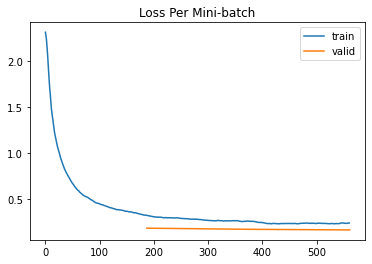

In [ ]:
learn.recorder.plot_loss(skip_start=0)
plt.title("Loss Per Mini-batch");

In [ ]:
tst_logprobs, tst_targets = learn.get_preds(dl=test_dl)
tst_loss, tst_acc = learn.validate(dl=test_dl)
tst_preds = tst_logprobs.argmax(axis=1)

print("Test loss: {:.5f} accuracy: {:.5f}".format(tst_loss, tst_acc))
tst_preds

Test loss: 0.16009 accuracy: 0.95220


tensor([1, 8, 5,  ..., 9, 1, 5])

In [ ]:
tst_incorrect_preds = torch.where((tst_targets == tst_preds) == False)[0]
print("Number of test data samples misclassified: {}".format(len(tst_incorrect_preds)))

Number of test data samples misclassified: 478


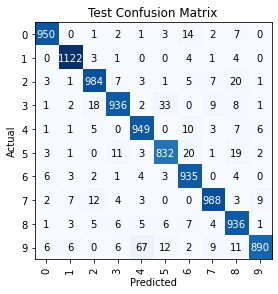

In [ ]:
tst_interp = ClassificationInterpretation.from_learner(learn, dl=test_dl)

tst_interp.plot_confusion_matrix(title="Test Confusion Matrix")

Here is why we shuffled our test data and wrapped our loss function in the `BaseLoss` FastAI class. Below, is a neat FastAI visualization that let's us take a small glimpse at how our test data predictions are doing.

The top number above each image is the target label while the bottom number is the prediction for said image. If the prediction does not match the target then the color is red otherwise the color is green. This means we can see which samples we are misclassifying and what we are classifying them as!

Note, if we didn't shuffled our test data we would only be seeing instances of class 0 as the first $n$ samples are all 0s and the next $n$ samples are all a another class. Additionally, by setting the `.decode()` method for `BaseLoss` our `Learner` now knows how to get the predictions based on the output of our model which allows this visualization to happen. If we didn't do this, this visualization would have thrown a very cryptic error!

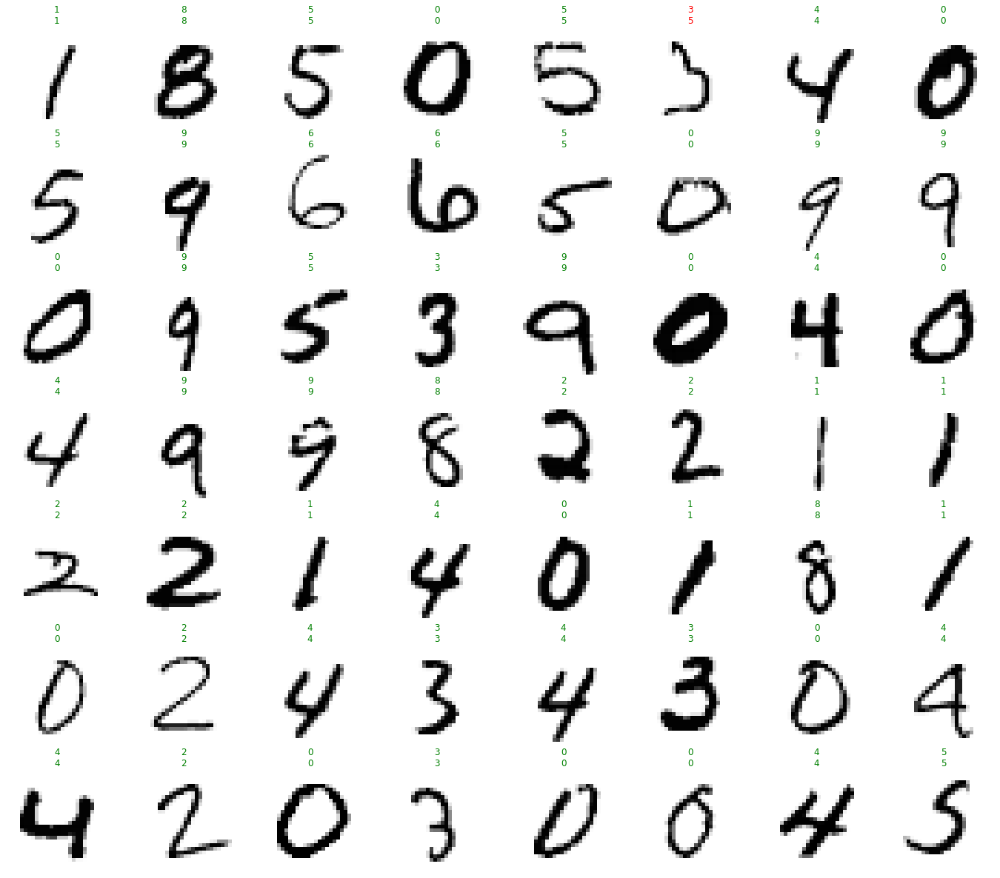

In [ ]:
learn.show_results(dl=test_dl, max_n=56)

Not bad, our baseline is doing quite good! Let's see if we can't improve the accuracy using a CNN!

### Building Our First CNN

Finally, it is time to build our first CNN! To do so, let's replicate the structure of the CNN given in the below image. This image is a typical digram that you will see people use to describe their architecture of their CNN. Knowing how to read this diagram is important!

<img src="https://live.staticflickr.com/65535/51099392393_4a6b223df7_o.png" width="1000" height="500" alt="cnn-mnist">

<div id="TODO3"></div>

#### TODO 3

Using the above diagram, let's first define the CNN layers. Note that the bold number under each image or layer represents the output of the layer. For instance, after applying the first `Conv2d` layer we get an output shape of (10, 24, 24) which means we now have 10 filters or channels and our image is now of size 24x24 (notice batch size is not included).

**Hint: If you are having trouble figuring out how to read the above image be sure to refer the notes or Part 6 video going over the notes!**

1. Define an PyTorch neural network using the `nn.Sequential` and store the output into `cnn_layers`. Be sure to move the model to the correct device using `.to(device)`. Within the `nn.Sequential()` initialization add the following layers:
    1. Define a `nn.Conv2d` layer followed by a `nn.ReLU` activation. Specify the correct `in_channels`, `out_channels`, and `kernel_size` parameters for the `nn.Conv2d` layer.
    2. Define a `nn.MaxPool2d` layer with the correct `kernel_size` parameter.
    3. Define a `nn.Conv2d` layer followed by a `nn.ReLU` activation. Specify the correct `in_channels`, `out_channels`, and `kernel_size` parameters for the `nn.Conv2d` layer.
    4. Define a `nn.MaxPool2d` layer with the correct `kernel_size` parameter.

In [ ]:
# TODO 3.1



The output of your network should be `[batch_size, filters, width, height]` or `(256, 20, 4, 4)`. We can check this by sending a random training batch from our data through the CNN layers and checking the output.

In [ ]:
x, y = trn_vld_dls.one_batch()
cnn_output = cnn_layers(x)
cnn_output.shape

torch.Size([256, 20, 4, 4])

<div id="TODO4"></div>

#### TODO 4

Given the output of our CNN layers we can now define the dense or fully connected layers! The bold number under each fully connected layer corresponds either to the number of neurons. For the flatten layer, this bold number corresponds to the flattened dimension.

1. Define an PyTorch neural network using the `nn.Sequential` and store the output into `fc_layers`. Be sure to move the model to the correct device using `.to(device)`. Within the `nn.Sequential()` add the following layers:
    1. Add a `nn.Flatten` layer to our network to flatten the inputs.
    2. Define a `nn.Linear` layer with the correct `in_features` and `out_features` parameter followed by a `nn.ReLU` activation.
    3. Define another `nn.Linear` layer with the correct `in_features` and `out_features` parameters followed by a `nn.LogSoftmax` activation.

In [ ]:
# TODO 4.1


Once again, the output of the `fc_layers` should be `[batch_size, classes]` or `(256, 10)`. We can check this by feeding the `cnn_output` into out `fc_layers` to double check this is what we are getting.

In [ ]:
fc_output = fc_layers(cnn_output)
fc_output.shape

torch.Size([256, 10])

<div id="TODO5"></div>

#### TODO 5

All that is left is wrapping both the `cnn_layers` and `fc_layers` into a single model.

1. Wrap both the `cnn_layers` and `fc_layers` in a `nn.Sequential` and store the output into `model`.
    1. Be sure to add an asterisk before each variable such that we type `*cnn_layers` and `*fc_layers`, otherwise the `reset_model()`function will not reset the weights of your model!
2. Using the `summary()` function output answer the following question.
    1. Where are the majority of our weights/parameters coming from in our combined model? For instance, which layer(s) seem to contain the most number of weights? Conv2d? Linear?

In [ ]:
# TODO 5.1

assert len(model) != 2, "You need to add an asterisk before cnn_layers and fc_layers!"

In [ ]:
summary(model, x.shape[1:]);

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 10, 24, 24]             260
              ReLU-2           [-1, 10, 24, 24]               0
         MaxPool2d-3           [-1, 10, 12, 12]               0
            Conv2d-4             [-1, 20, 8, 8]           5,020
              ReLU-5             [-1, 20, 8, 8]               0
         MaxPool2d-6             [-1, 20, 4, 4]               0
           Flatten-7                  [-1, 320]               0
            Linear-8                  [-1, 128]          41,088
              ReLU-9                  [-1, 128]               0
           Linear-10                   [-1, 10]           1,290
       LogSoftmax-11                   [-1, 10]               0
Total params: 47,658
Trainable params: 47,658
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/ba

`TODO 5.2` Where are the majority of our weights/parameters coming from? For instance, which layer(s) seem to contain the most number of weights? Conv2d? Linear?

**DO NOT WRITE YOUR ANSWER IN THIS CELL!**


`Answer`:


### Training Our First CNN

**Warning: This may take a 5+ minutes to run and MUCH longer if you aren't using a GPU.**


Now, let's quickly run the code to train our CNN!

In [ ]:
nll_loss = BaseLoss(nn.NLLLoss)

def decode_nllloss(x):
    return x.argmax(axis=1)
nll_loss.decodes = decode_nllloss

reset_model(model)
learn = Learner(trn_vld_dls, model, opt_func=Adam, loss_func=nll_loss, metrics=accuracy)

In [ ]:
learn.fit(3, lr=.01)

epoch,train_loss,valid_loss,accuracy,time
0,0.116010,0.078445,0.974250,00:05
1,0.066953,0.075583,0.976833,00:05
2,0.050455,0.057182,0.983000,00:05


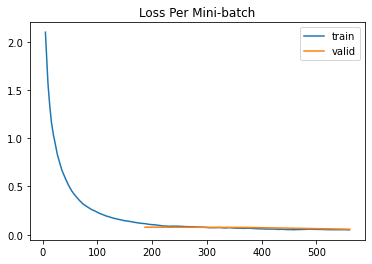

In [ ]:
learn.recorder.plot_loss()
plt.title("Loss Per Mini-batch")
plt.show()

In [ ]:
tst_logprobs, tst_targets = learn.get_preds(dl=test_dl)
tst_loss, tst_acc = learn.validate(dl=test_dl)
tst_preds = tst_logprobs.argmax(axis=1)

print("Test loss: {:.5f} accuracy: {:.5f}".format(tst_loss, tst_acc))
tst_preds

Test loss: 0.04488 accuracy: 0.98580


tensor([1, 8, 5,  ..., 9, 1, 5])

In [ ]:
tst_incorrect_preds = torch.where((tst_targets == tst_preds) == False)[0]
print("Number of test data samples misclassified: {}".format(len(tst_incorrect_preds)))

Number of test data samples misclassified: 142


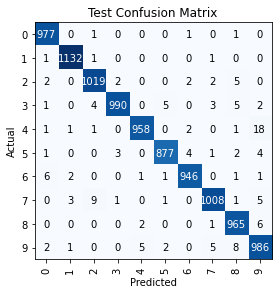

In [ ]:
tst_interp = ClassificationInterpretation.from_learner(learn, dl=test_dl)

tst_interp.plot_confusion_matrix(title="Test Confusion Matrix")

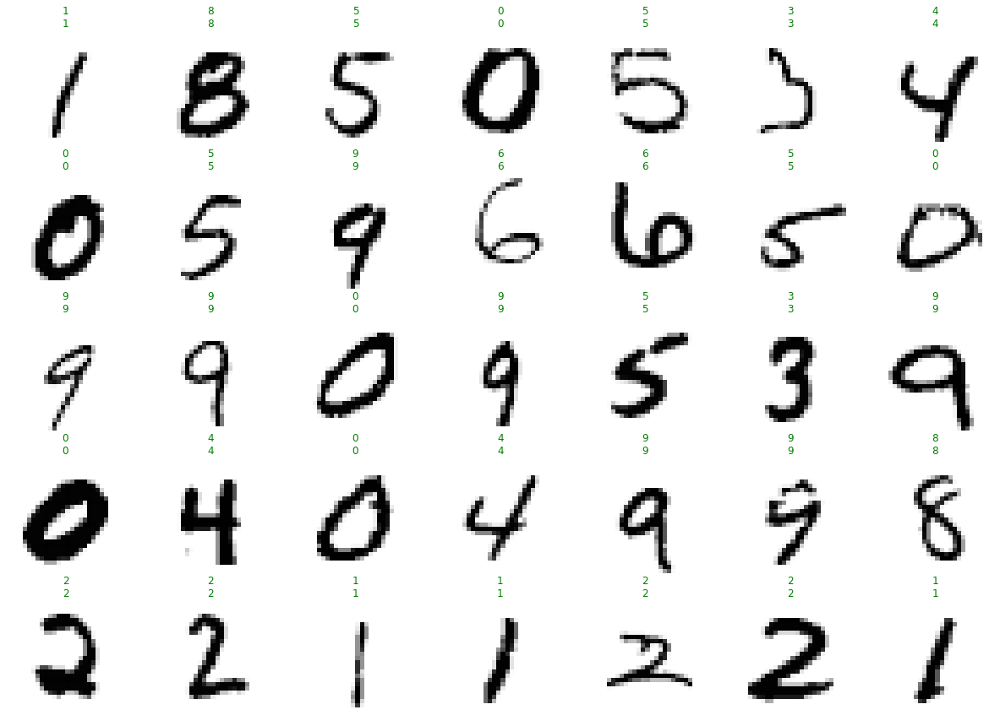

In [ ]:
learn.show_results(dl=test_dl, max_n=35)

Wow, look at that! We can see the CNN improved our accuracy about 2-3%. While this may not sound like much, it is actually quite an improvement. Once we start hitting 90% accuracy it becomes progressively harder to gain even a 1% increase in accuracy!

# Classifying Dogs and Cats With CNNs

Alight, let's try using the power of CNNs on a much harder dataset called [Oxford-IIIT Pet Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/). This dataset contains a wide verity of different images of dog and cat breeds. Normally, we would use this dataset to predict the dog or cat breed for a given image, however this is far to difficult of a task for us to overcome in a single lab! The below chart shows all the different types of dog and cat breed images contained within the dataset and the total number images that are either a dog or a cat.

Instead of predicting each breed of dog or cat, we are going to reduce the problem to a predicting whether a given image as is either simply a dog or cat. As you will see, this is actually quite a hard problem for the simple CNNs we'll be building.


<img src="https://www.robots.ox.ac.uk/~vgg/data/pets/breed_count.jpg">

## Loading the Pets Data

In order to load the Pets dataset we will need to use FastAI's `DataBlock` class again. To do so, we'll need to first download the data using `untar_data` and FastAI's `URLs.PETS` which is a URL to the Pets dataset linked above.

In [ ]:
pet_path = untar_data(URLs.PETS)
pet_path

Path('/home/dev/.fastai/data/oxford-iiit-pet')

Now that our data is downloaded, we need to find the path which contains all our images. The first thing to do then is to call the `.ls()` method on our `Path` instance  variable `pet_path` to see a list of the sub-directories or files contained within the `../oxford-iiit-pet/` directory.

In [ ]:
pet_path.ls()

(#2) [Path('/home/dev/.fastai/data/oxford-iiit-pet/annotations'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images')]

As we can see there are two sub-directories available to us: "annotations" and "images". I'm not sure about you, but maybe the "images" directory might just contain the pet images...

In [ ]:
(pet_path / 'images').ls()

(#7393) [Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Bombay_53.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/basset_hound_144.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Sphynx_240.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/basset_hound_38.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/boxer_67.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Abyssinian_49.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/newfoundland_160.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/yorkshire_terrier_169.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Ragdoll_170.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_109.jpg')...]

Nice, so it seems we have found the location of our images. Let's go ahead and call the FastAI `get_image_files()` on this path. Remember that the `get_image_files()` function will get all file paths that are actually images, whereas if we used the `.ls()` method this would simply give us all the files contained in a directory, regardless if they are an image for not. Notice, when we run `get_image_files()` there will be ~3 less files than what the `.ls()` method produced, this indicates that the `../oxford-iiit-pet/images` directory contains non-image files as well.

In [ ]:
pet_image_paths = get_image_files((pet_path / 'images'))
pet_image_paths.sort()
pet_image_paths

(#7390) [Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Abyssinian_1.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Abyssinian_10.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Abyssinian_100.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Abyssinian_101.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Abyssinian_102.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Abyssinian_103.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Abyssinian_104.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Abyssinian_105.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Abyssinian_106.jpg'),Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Abyssinian_107.jpg')...]

**There are a few things to notice about our data file paths before we move on.**
1. First, notice that there is no train or test splits for the data so we will need to manually create the split ourselves.
2. Second, notice that there are only 7390 images.
    1. Since there are so few images samples, recall MNIST had 60k, we might have a hard time learning due to the lack of data as deep neural networks tend to be quite data hungry.
    2. Also, note that we are a few images short of the total number of images reported in the above chart. This is most likely because the chart is out-of-date and some samples have been removed.


### Building the DataBlock

Before we can build our `DataBlock` class there are three things we need to address:
1. First, we need to define a function which will label our data either as a cat or a dog. This function will be passed to the `get_y` parameter for our `DataBlock`.

2. Second, we will need to figure out how we can resize our images using FastAI as the images in the Pets dataset are actually different sizes. Whatever function or class we find will then need to be passed to the `item_tfms` parameter for our `DataBlock` so that each image is resized before reaching the CNN.

3. Lastly, we need to create the train and test splits for our data. We can do so before we even load our data by allocating some of the file paths to our train set `trn_paths` and the remaining file paths to the test set `tst_paths`. We can then pass `trn_paths` to the `.dataloaders()` method to load in ONLY our train data!

#### (1) Building Labels from Paths

Let's first tackle the problem of how to label each of our files as either "dog" or "cat".  Let's load a sample image from our dataset to help us figure out how we can label our data given only the path information.

In [ ]:
pet_example = pet_image_paths[1]
pet_example

Path('/home/dev/.fastai/data/oxford-iiit-pet/images/Abyssinian_10.jpg')

The solution to defining whether a file belongs to the dog or cat class turns out to be rather simple as there is a secrete to knowing whether an image belongs a certain class. That secrete is that if the first letter of the file name is lower case then it belongs to the dog class. Otherwise, if the first letter of the file name is a capital letter then it belongs to the cat class!

Well, we can get the name of a file from a `Path` object by simply calling the `.name` attribute.

In [ ]:
pet_example.name

'Abyssinian_10.jpg'

Next, we can get the first letter of the name simply by indexing the string at 0. We can index a string because a string is actually really just a list in Python.

In [ ]:
pet_example.name[0]

'A'

Lastly, we can check if the first letter of the name is capital by calling the string `.isupper()` method which will return `True` if the character is capitalized.

In [ ]:
pet_example.name[0].isupper()

True

Nice, we can see that our example pet image path has a file name where the first letter is capitalized. This means it must be a cat image!

Alright, all that is left is turning this idea into a function which we do below by combining all the aforementioned ideas.

In [ ]:
def label_func(fname):
    return "cat" if fname.name[0].isupper() else "dog"

We can test to see if our function works by passing our `pet_example` pet path to the function and then loading and visualizing the actual image using `PILImage.create`.

In [ ]:
label_func(pet_example)

'cat'

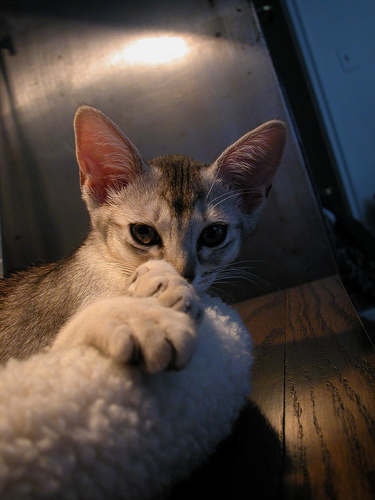

In [ ]:
PILImage.create(pet_example)

Look at that, our labeling function seems to be working!

#### (2) Resizing

The next thing we need to investigate is how to resize our data. First, let's load two examples from out dataset and let's check their shapes.

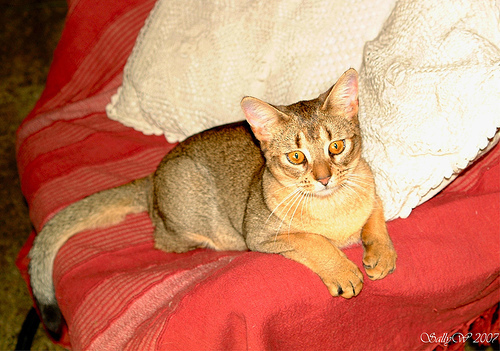

In [ ]:
pet_example1 = pet_image_paths[5]
pet_img1 = PILImage.create(pet_example1)
pet_img1

In [ ]:
pet_img1.shape

(351, 500)

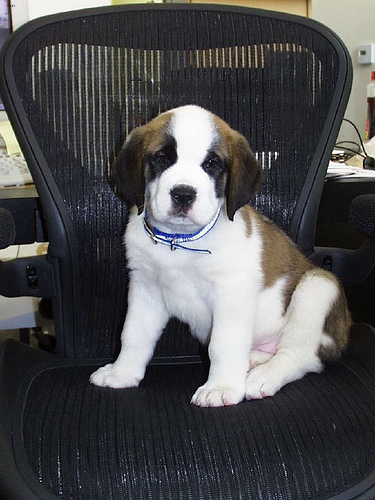

In [ ]:
pet_example2 = pet_image_paths[6000]
pet_img2 = PILImage.create(pet_example2)
pet_img2

In [ ]:
pet_img2.shape

(500, 375)

Notice that the above two pet images are different shapes! This is a problem because all our images must be of the same size if we are going to use a CNN or really any neural network.

Well, what can we do? It turns out, you might have guessed it, there's a FastAI class to save the day. This class is called `Resize`. All we have to do to use it, is initialize the class with the desired reshaped image size, in this case we will do 128. Also, note that we pass `method='squish'`, this prevents sections of the images from being cropped out or cut off after resizing.

Note, when we pass 128 or any integer to the `Resize` class it assumes that we want to resize our image to a square image such that we will get a 128x128 image back. If we wanted a non-square image back after resizing we could specify a tuple or list containing the desired image size. For instance, we could alternatively pass `(128, 100)` to get a 128x100 image back.

In [ ]:
resize = Resize(128, method='squish')

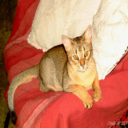

In [ ]:
resize(pet_img1)

In [ ]:
resize(pet_img1).shape

(128, 128)

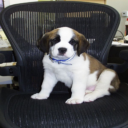

In [ ]:
resize(pet_img2)

In [ ]:
resize(pet_img2).shape

(128, 128)

Awesome, so now we have a FastAI class which can resize all our images to the same size!

#### (3) Splitting Data

Last but not least we need to split our file paths such that we have a variable which holds all our training image paths and a variable which holds all our testing image paths.

Once again, there is a FastAI class called `TrainTestSplitter` ([docs](https://docs.fast.ai/data.transforms.html#TrainTestSplitter)) which will do the splitting for us. However, you might have noticed from the Pets dataset chart that there are more dog samples than cat samples such that there are about twice as many dog samples as cats. In order to preserve this ratio such that our train set and test set both have roughly the same proportion of cat-to-dog images we can specify the `stratify` parameter. All the `stratify` parameter takes is list of the labels for our all data samples.

Below quote from a [post](https://medium.com/analytics-vidhya/stratified-sampling-in-machine-learning-f5112b5b9cfe) on why stratified sampling is important:

> Stratified random sampling accurately reflects the population being studied. It ensures each subgroup within the population receives proper representation within the sample.

We can quickly get all the labels for our data by looping over all our pet image paths and using our `label_func` to label the images, as seen below.

In [ ]:
labels = []

for i, img_path in enumerate(pet_image_paths):
    img_label = label_func(img_path)
    labels.append(img_label)

labels = np.array(labels)
labels

array(['cat', 'cat', 'cat', ..., 'dog', 'dog', 'dog'], dtype='<U3')

Next, we can pass all the information we need to the `TrainTestSplitter()`.

- Parameter description
    - `test_size`: Proportion of data for testing.
    - `shuffle`: Determines whether data is shuffled.
    - `stratify`: Splits our data such that the same training data ratio per class is replicated in the testing data.
    - `random_state`: A seed for reproducing the shuffle.

In [ ]:
tts = TrainTestSplitter(test_size=.1, shuffle=True, stratify=labels, random_state=0)

Once we call `tts` which is an instance of `TrainTestSplitter` it will return the indices for the training and testing splits.

In [ ]:
trn_idx, tst_idx = tts(pet_image_paths)
trn_idx, tst_idx

((#6651) [778,2707,3973,472,3539,1938,1646,3237,815,2749...],
 (#739) [2536,3537,6617,637,1896,3948,5714,2076,807,797...])

In [ ]:
trn_cls, trn_cls_cnt = np.unique(labels[list(trn_idx)], return_counts=True)


In [ ]:
print("The {} class has for the training data has {} samples".format(trn_cls[0],
                                                                      trn_cls_cnt[0]))
print("The {} class has for the training data has {} samples".format(trn_cls[1],
                                                                      trn_cls_cnt[1]))
print("The training data cat-to-dog ratio is {:.5f} or {}/{} ".format(trn_cls_cnt[0]/trn_cls_cnt[1],
                                                                  trn_cls_cnt[0], trn_cls_cnt[1]))

The cat class has for the training data has 2160 samples
The dog class has for the training data has 4491 samples
The training data cat-to-dog ratio is 0.48096 or 2160/4491 


In [ ]:
tst_cls, tst_cls_cnt =np.unique(labels[list(tst_idx)], return_counts=True)

In [ ]:
print("The {} class has for the training data has {} samples".format(tst_cls[0],
                                                                      tst_cls_cnt[0]))
print("The {} class has for the training data has {} samples".format(tst_cls[1],
                                                                      tst_cls_cnt[1]))
print("The testing data cat-to-dog ratio is {:.5f} or {}/{} ".format(tst_cls_cnt[0]/tst_cls_cnt[1],
                                                                  tst_cls_cnt[0], tst_cls_cnt[1]))

The cat class has for the training data has 240 samples
The dog class has for the training data has 499 samples
The testing data cat-to-dog ratio is 0.48096 or 240/499 


So our train and test split ratios are roughly the same now so we can finally index our `pet_image_paths` using the `trn_idx` and `tst_idx` to then create `trn_paths` and `tst_paths`.

In [ ]:
trn_paths = pet_image_paths[trn_idx]
tst_paths  = pet_image_paths[tst_idx]

<div id="TODO6"></div>

#### TODO 6

Let's build our `DataBlock` class by using the `label_func` we defined above and the `Resize` class we discovered and then finally let's pass our `trn_paths` to the `.dataloaders()` method.

1. Create an instance of the `DataBlock()` class and store the output into `pet_db`. Within the `DataBlock()` initialization complete the following sub-TODOs.
    1. Use the `ImageBlock` class which will load RGB images and `CategoryBlock` class as our block parameters.
    2. Pass the `RandomSplitter` to the `splitter` parameter and set the `seed=0`.
    3. Pass a pointer to our `label_func` to the `get_y` parameter.
    4. Pass the `Resize(128, method='squish')` class to the `item_tfms` so all our images will be reshaped just before any batch transformations are applied.
2. Call the `.dataloaders()` method and pass our training paths and a batch size of 128.

In [ ]:
# TODO 6.1


In [ ]:
# TODO 6.2


Now that we have loaded our data let's do a quick visualization to make sure things look right. Below we print out both the `train_ds` and `valid_ds` created by the `DataBlock`

In [ ]:
trn_vld_dls.train_ds

(#5321) [(PILImage mode=RGB size=500x375, TensorCategory(1)),(PILImage mode=RGB size=500x333, TensorCategory(0)),(PILImage mode=RGB size=500x333, TensorCategory(0)),(PILImage mode=RGB size=500x376, TensorCategory(0)),(PILImage mode=RGB size=300x215, TensorCategory(1)),(PILImage mode=RGB size=500x375, TensorCategory(0)),(PILImage mode=RGB size=500x375, TensorCategory(1)),(PILImage mode=RGB size=500x375, TensorCategory(1)),(PILImage mode=RGB size=333x500, TensorCategory(1)),(PILImage mode=RGB size=500x333, TensorCategory(0))...]

In [ ]:
trn_vld_dls.valid_ds

(#1330) [(PILImage mode=RGB size=500x359, TensorCategory(1)),(PILImage mode=RGB size=375x500, TensorCategory(1)),(PILImage mode=RGB size=500x323, TensorCategory(1)),(PILImage mode=RGB size=500x338, TensorCategory(1)),(PILImage mode=RGB size=352x319, TensorCategory(0)),(PILImage mode=RGB size=480x320, TensorCategory(1)),(PILImage mode=RGB size=500x375, TensorCategory(1)),(PILImage mode=RGB size=300x157, TensorCategory(0)),(PILImage mode=RGB size=500x375, TensorCategory(1)),(PILImage mode=RGB size=500x375, TensorCategory(1))...]

Notice our images have not been resized yet. The resizing will occur when a batch is taken of our data.

As a note, anytime you see the parameter `item_tfms` with transformations passed to it, this means apply the passed transformations before the batch transformations are applied. Likewise, when you see the `batch_tfms` parameter with transformations passed to it, this means the passed transformations are applied after the `item_tfms` have been applied.

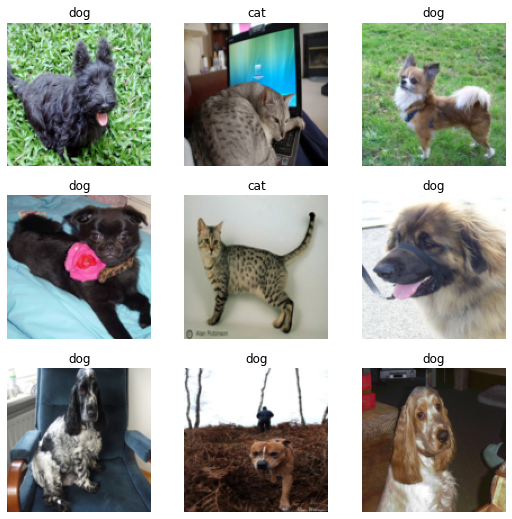

In [ ]:
trn_vld_dls.show_batch()

We can quickly print out a batch and see that our images have all been resized! Also note, all our images are in color which is completely fine sense CNNs are made for working with multiple channels while dense or fully connected neural networks aren't as much!

We can also check our batch size and confirm that our images have been resized and that we have 3 channels which are the RGB color dimensions.

In [ ]:
x, y = trn_vld_dls.one_batch()
print("One batch of data has the shape: {}".format(x.shape))
print("One batch of targets has the shape: {}".format(y.shape))

One batch of data has the shape: torch.Size([128, 3, 128, 128])
One batch of targets has the shape: torch.Size([128])


<div id="TODO7"></div>

#### TODO 7

Finally, let's load our test data.

1. Load the test data by passing the variable which is storing all the paths to our test images to the `.test_dl()` method for our `trn_vld_dls` `Dataloaders` instance. Be sure that the labels are loaded as well! Store the output into `test_dl`

In [ ]:
# TODO 7.1

test_dl.dataset

(#739) [(PILImage mode=RGB size=500x375, TensorCategory(1)),(PILImage mode=RGB size=300x500, TensorCategory(1)),(PILImage mode=RGB size=500x375, TensorCategory(1)),(PILImage mode=RGB size=360x305, TensorCategory(0)),(PILImage mode=RGB size=500x442, TensorCategory(0)),(PILImage mode=RGB size=500x333, TensorCategory(1)),(PILImage mode=RGB size=500x333, TensorCategory(1)),(PILImage mode=RGB size=500x346, TensorCategory(0)),(PILImage mode=RGB size=500x375, TensorCategory(0)),(PILImage mode=RGB size=450x342, TensorCategory(0))...]

## Building a CNN

Now, it's time to build our CNN for cat and dog classification. Just like MNIST, let's use the below CNN architecture diagram when building our CNN.

<img src="https://live.staticflickr.com/65535/51103504967_6d7489f8fc_o.png" width="1000" height="500" alt="cnn-pets">

<div id="TODO8"></div>

#### TODO 8

Use the above CNN diagram in order to specify the correct parameters!

**Hint: If you are having trouble figuring out how to read the above image be sure to refer the notes or the videos going over the notes!**

1. Define an PyTorch neural network using the `nn.Sequential` and store the output into `cnn_layers`. Be sure to move the model to the correct device using `.to(device)`. Within the `nn.Sequential()` initialization add the following layers:
    1. Define a `nn.Conv2d` layer followed by a `nn.ReLU` activation. Specify the correct `in_channels`, `out_channels`, and `kernel_size` parameters for the `nn.Conv2d` layer.
    2. Define a `nn.MaxPool2d` layer with the correct `kernel_size` parameter.
    3. Define a `nn.Conv2d` layer followed by a `nn.ReLU` activation. Specify the correct `in_channels`, `out_channels`, and `kernel_size` parameters for the `nn.Conv2d` layer.
    4. Define a `nn.MaxPool2d` layer with the correct `kernel_size` parameter.
    5. Define a `nn.Conv2d` layer followed by a `nn.ReLU` activation. Specify the correct `in_channels`, `out_channels`, and `kernel_size` parameters for the `nn.Conv2d` layer.
    6. Define a `nn.MaxPool2d` layer with the correct `kernel_size` parameter.

In [ ]:
# TODO 8.1



The output of your network should be `[batch_size, filters, width, height]` or `(128, 128, 14, 14)`. We can check this by sending a random training mini-batch from our data through the CNN layers and checking the output.

In [ ]:
x, y = trn_vld_dls.one_batch()
cnn_output = cnn_layers(x)
cnn_output.shape

torch.Size([128, 128, 14, 14])

<div id="TODO9"></div>

#### TODO 9

Given the output of our CNN layers we can now define the dense or fully connected layers! The bold number under each fully connected layer corresponds either to the number of neurons. For the flatten layer, this bold number corresponds to the flattened dimension.

1. Define an PyTorch neural network using the `nn.Sequential` and store the output into `fc_layers`. Be sure to move the model to the correct device using `.to(device)`. Within the `nn.Sequential()` add the following layers:
    1. Add a `nn.Flatten` layer to our network to flatten the inputs.
    2. Define a `nn.Linear` layer with the correct `in_features` and `out_features` parameter followed by a `nn.ReLU` activation.
    3. Define another `nn.Linear` layer with the correct `in_features` and `out_features` parameters followed by a `nn.LogSoftmax` activation.

In [ ]:
# TODO 9.1


Once again, the output of the `fc_layers` should be `[batch_size, classes]` or `(128, 2)`. We can check this by feeding the `cnn_output` into out `fc_layers` to double check this is what we are getting.


In [ ]:
fc_output = fc_layers(cnn_output)
fc_output.shape

/home/dev/miniconda/envs/mlenv/lib/python3.8/site-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


torch.Size([128, 2])

All that is left is wrapping both the `cnn_layers` and `fc_layers` into a single model.

In [ ]:
model = nn.Sequential(*cnn_layers, *fc_layers)

Take a second to look at all those parameters being produced by the linear layer. Our CNN parameters really are just a fraction of the total parameters. This explosion of parameters from being fully connected is why deep fully connected networks can be powerful but also sometimes too power for their own good.

In [ ]:
summary(model, x.shape[1:]);

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 126, 126]             896
              ReLU-2         [-1, 32, 126, 126]               0
         MaxPool2d-3           [-1, 32, 63, 63]               0
            Conv2d-4           [-1, 64, 61, 61]          18,496
              ReLU-5           [-1, 64, 61, 61]               0
         MaxPool2d-6           [-1, 64, 30, 30]               0
            Conv2d-7          [-1, 128, 28, 28]          73,856
              ReLU-8          [-1, 128, 28, 28]               0
         MaxPool2d-9          [-1, 128, 14, 14]               0
          Flatten-10                [-1, 25088]               0
           Linear-11                  [-1, 128]       3,211,392
             ReLU-12                  [-1, 128]               0
           Linear-13                    [-1, 2]             258
       LogSoftmax-14                   

### Training the CNN

<div id="TODO10"></div>

#### TODO 10

Now that we have a model, we can define our loss and `Learner`. Once we have done this we can begin training and then visualize our results!

**Warning: This may take a 5+ minutes to run and MUCH longer if you aren't using a GPU.**

1. Declare the `NLLLoss` PyTorch class and wrap it in the `BaseLoss` FastAI class. Store the output into `nll_loss`.
    1. See the example given during a MNIST training for further guidance.
2. Define a `Learner` instance using `trn_vld_dls`, `model` and `nll_loss`. Also, be sure to pass `Adam` as the optimizer and the FastAI function `accuracy` as an additional metric to track. Store the output into `learn`.
3. Use the `.get_preds()` method for `learn` to get the **test** log probabilities and targets for our **test data**. Be sure to pass `test_dl` to the `dl` parameter! Store the outputs into `tst_logprobs` and `tst_targets`.
4. Use the `.validate` method for `learn` to get the **test** loss and accuracy.Be sure to pass `test_dl` to the `dl` parameter! Store the outputs into `tst_loss` and `tst_acc`.
5. Take the `argmax` of `tst_logprobs` to get the test predictions. Be sure to specify the correct axis! Store the output into `tst_preds`.
6. Create a `ClassificationInterpretation` instance by using the `.from_learner()` method. Be sure to pass our learner and **test data** to the method.
7. Show the results of the **test** predictions by using the `.show_results()` method from our `learn` instance variable. Further, be sure to pass `max_n=35` to see more images and `shuffle=False` to keep the results from shuffling.

In [ ]:
# TODO 10.1


def decode_nllloss(x):
    return x.argmax(axis=1)
nll_loss.decodes = decode_nllloss

reset_model(model)

# TODO 10.2


In [ ]:
learn.fit(3, .001)

epoch,train_loss,valid_loss,accuracy,time
0,0.632125,0.635858,0.657143,00:05
1,0.614542,0.608756,0.657143,00:05
2,0.580251,0.558185,0.681203,00:04


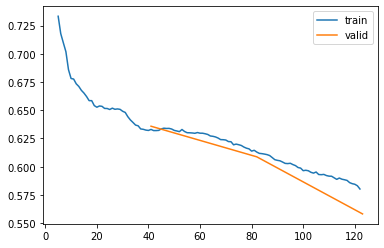

In [ ]:
learn.recorder.plot_loss()

In [ ]:
# TODO 10.3 - 10.5

print("Test loss: {:.5f} accuracy: {:.5f}".format(tst_loss, tst_acc))

Test loss: 0.54921 accuracy: 0.70907


In [ ]:
tst_incorrect_preds = torch.where((tst_targets == tst_preds) == False)[0]
print("Number of test data samples misclassified: {}".format(len(tst_incorrect_preds)))

Number of test data samples misclassified: 215


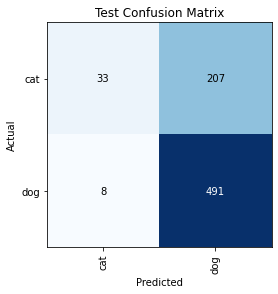

In [ ]:
# TODO 10.6

tst_interp.plot_confusion_matrix(title="Test Confusion Matrix")

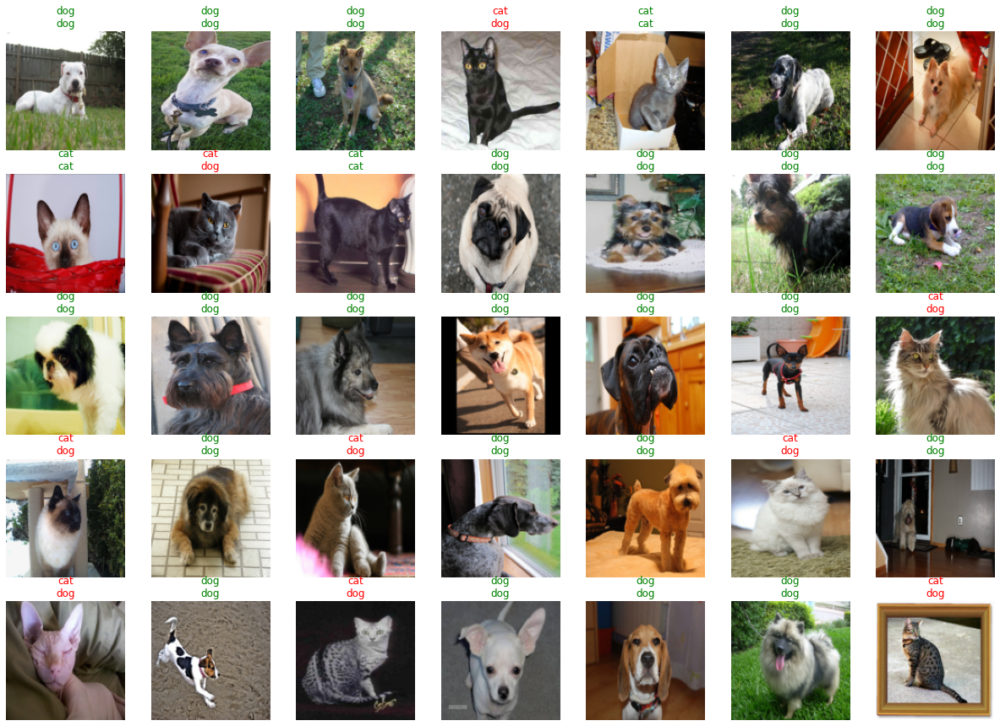

In [ ]:
# TODO 10.7


Welp, the results aren't looking so hot, but they are looking much better than random chance! If you have done things correctly up to this point you should be seeing around ~68-75% accuracy for the validation set and ~70-77% accuracy for the test set. Let's see if we can't improve our network by using some special layers!

Before moving on, take a second to see if you can notice a pattern in the misclassified images given by the `.show_results()` method you wrote for `TODO 10-7`. It is usually really hard to tell what is happening simply by looking at the output of a network but sometimes you might gleam an interesting insight!

## Adding Special Layers: Batch Normalization

One of the most important special layers we can add to a convolutional neural network, and other neural networks in general, is the Batch Normalization (Norm) layer. So, what is a Batch Norm layer? Before we can understand what a Batch Norm layer is we first must recall what normalization and standardization are in general.

### Recall Normalization and Standardization

Remember that we typically normalize the input features of our data so that their value range lies between the values of 0 and 1. Alternatively, we standardize our data such that the input features have a mean of 0 and standard deviation (STD) of 1. So why do we normalize or standardize again?

Recall that weights tend to be proportional to the scale of the values for their corresponding feature. For instance, some features have small ranges and therefore small weights, this means these weights will need smaller adjustments when being updated ([ref](https://www.analyticsvidhya.com/blog/2020/04/feature-scaling-machine-learning-normalization-standardization/)). Meanwhile, other features, and therefore weights, have larger value ranges and require larger adjustments when being updated. This means that when we use an algorithm like gradient descent each feature with a different scale or value range we will require a different learning rate that is proportional to the scale of said feature. This is not desirable, so we normalization or standardize our input features so all features operate on the same scale, causing our learning to be smoother!

### What is Batch Norm?

Batch Norm layers take this same idea of standardization but now applies it to our data at each layer within a neural network (or just the layers we tell it to)! The Batch Norm layer typically occurs right after the activation layer. This means, each neuron activation is then standardization with respect to the mini-batch, causing the activation outputs to lie close to 0 and have a standard deviation close to 1. In turn, this makes the weights connecting each layer all operate on the same scale as well!

There are loads more important details about Batch Norm that we could discuss, however this high-level overview will have to suffice for now. Check out the below references if you want to learn more. If you are still left scratching your head just know that Batch Norm tends to have two main benefits:

1. It smooths the loss function and therefore tends to increase the speed of learning
    - It also tends to produce lower losses.
3. It introduces small amounts of regularization as the mean and STD are dependent on the mini-batches.
    - Being dependent on the mini-batch mean and STD causes noise to be introduced into each neuron's activation. Note that dependency on the mini-batch means that the mean and STD change per mini-batch.

- References
    - [video] [Normalizing Activations in a Network](https://www.youtube.com/watch?v=tNIpEZLv_eg)
    - [video] [Batch Normalization Explained](https://www.youtube.com/watch?v=dXB-KQYkzNU)
    - [video] [Why does Batch Norm work?](https://www.youtube.com/watch?v=nUUqwaxLnWs)
    - [video] [Batch Normalization - EXPLAINED!](https://www.youtube.com/watch?v=DtEq44FTPM4)

<img src="https://live.staticflickr.com/65535/51103504967_6d7489f8fc_o.png" width="1000" height="500" alt="cnn-pets">

<div id="TODO11"></div>

#### TODO 11

**NOTE: THE DIAGRAM DOESN'T DISPLAY WHERE TO PUT BATCH NORM LAYERS, PLEASE READ THE TODO INSTRUCTIONS TO SEE WHERE!**

Define the same CNN architecture as we used for TODO 8 using the above CNN architecture diagram. However, now add the `nn.BatchNorm2d` layer ([docs](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm2d.html)) **after** every `nn.ReLU` activation. As a note, it is still hotly debated whether it is best to put the Batch Norm layer before or after the activation, however, for now, we will put it after the activation.


1. Define an PyTorch neural network using the `nn.Sequential` and store the output into `cnn_layers`. Be sure to move the model to the correct device using `.to(device)`. Within the `nn.Sequential()` initialization add the following layers:
    1. Define a `nn.Conv2d` layer followed by a `nn.ReLU` activation. Specify the correct `in_channels`, `out_channels`, and `kernel_size` parameters for the `nn.Conv2d` layer. Further, add the `nn.BatchNorm2d` layer AFTER the `nn.ReLU` activation where the `num_features` parameter is equal to the `out_channels` parameter for the `nn.Conv2d` layer.
    2. Define a `nn.MaxPool2d` layer with the correct `kernel_size` parameter.
    3. Define a `nn.Conv2d` layer followed by a `nn.ReLU` activation. Specify the correct `in_channels`, `out_channels`, and `kernel_size` parameters for the `nn.Conv2d` layer. Further, add the `nn.BatchNorm2d` layer AFTER the `nn.ReLU` activation where the `num_features` parameter is equal to the `out_channels` parameter for the `nn.Conv2d` layer.
    4. Define a `nn.MaxPool2d` layer with the correct `kernel_size` parameter.
    5. Define a `nn.Conv2d` layer followed by a `nn.ReLU` activation. Specify the correct `in_channels`, `out_channels`, and `kernel_size` parameters for the `nn.Conv2d` layer. Further, add the `nn.BatchNorm2d` layer AFTER the `nn.ReLU` activation where the `num_features` parameter is equal to the `out_channels` parameter for the `nn.Conv2d` layer.
    6. Define a `nn.MaxPool2d` layer with the correct `kernel_size` parameter.

In [ ]:
# TODO 11.1


In [ ]:
x, y = trn_vld_dls.one_batch()
cnn_output = cnn_layers(x)
cnn_output.shape

torch.Size([128, 128, 14, 14])

<div id="TODO12"></div>

#### TODO 12

Given the output of our CNN layers we can now define the dense or fully connected layers! The bold number under each fully connected layer corresponds either to the number of neurons. For the flatten layer, this bold number corresponds to the flattened dimension.

1. Define an PyTorch neural network using the `nn.Sequential` and store the output into `fc_layers`. Be sure to move the model to the correct device using `.to(device)`. Within the `nn.Sequential()` initialization add the following layers:
    1. Add a `nn.Flatten` layer to our network to flatten the inputs.
    2. Define a `nn.Linear` layer with the correct `in_features` and `out_features` parameter followed by a `nn.ReLU` activation.
    3. Define another `nn.Linear` layer with the correct `in_features` and `out_features` parameters followed by a `nn.LogSoftmax` activation.

In [ ]:
# TODO 12.1


In [ ]:
fc_output = fc_layers(cnn_output)
fc_output.shape

torch.Size([128, 2])

In [ ]:
model = nn.Sequential(*cnn_layers, *fc_layers)

In [ ]:
from torchsummary import summary
summary(model, x.shape[1:]);

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 126, 126]             896
              ReLU-2         [-1, 32, 126, 126]               0
       BatchNorm2d-3         [-1, 32, 126, 126]              64
         MaxPool2d-4           [-1, 32, 63, 63]               0
            Conv2d-5           [-1, 64, 61, 61]          18,496
              ReLU-6           [-1, 64, 61, 61]               0
       BatchNorm2d-7           [-1, 64, 61, 61]             128
         MaxPool2d-8           [-1, 64, 30, 30]               0
            Conv2d-9          [-1, 128, 28, 28]          73,856
             ReLU-10          [-1, 128, 28, 28]               0
      BatchNorm2d-11          [-1, 128, 28, 28]             256
        MaxPool2d-12          [-1, 128, 14, 14]               0
          Flatten-13                [-1, 25088]               0
           Linear-14                  [

Let's take a second to look at the summary of the architecture. Notice that the `BatchNorm2d` layers learn 64, 128, and 256 parameters. This is because Batch Norm actually learns 2 parameters which are used to apply an affine transformation to the normalized activation output of the neuron. These parameters are typically referred to as $\gamma$ and $\beta$. The reason for these parameters is out-of-scope for this lab but just note they are there!

Next, let's run all training and observe the results!

**Warning: This may take a 5+ minutes to run and MUCH longer if you aren't using a GPU.**


In [ ]:
nll_loss = BaseLoss(nn.NLLLoss)

def decode_nllloss(x):
    return x.argmax(axis=1)
nll_loss.decodes = decode_nllloss

reset_model(model)
learn = Learner(trn_vld_dls, model, opt_func=Adam, loss_func=nll_loss, metrics=accuracy)

In [ ]:
learn.fit(3, .001)

epoch,train_loss,valid_loss,accuracy,time
0,0.893144,0.638621,0.645865,00:05
1,0.651298,0.580661,0.678947,00:04
2,0.548264,0.555848,0.712030,00:05


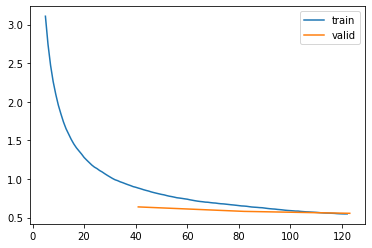

In [ ]:
learn.recorder.plot_loss()

In [ ]:
tst_logprobs, tst_targets = learn.get_preds(dl=test_dl)
tst_loss, tst_acc = learn.validate(dl=test_dl)
tst_preds = tst_logprobs.argmax(axis=1)
print("Test loss: {:.5f} accuracy: {:.5f}".format(tst_loss, tst_acc))

Test loss: 0.52929 accuracy: 0.72936


In [ ]:
tst_incorrect_preds = torch.where((tst_targets == tst_preds) == False)[0]
print("Number of test data samples misclassified: {}".format(len(tst_incorrect_preds)))

Number of test data samples misclassified: 200


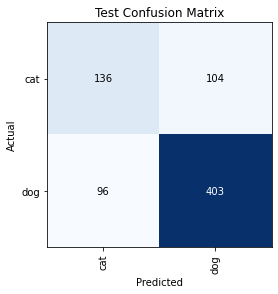

In [ ]:
tst_interp = ClassificationInterpretation.from_learner(learn, dl=test_dl)

tst_interp.plot_confusion_matrix(title="Test Confusion Matrix")

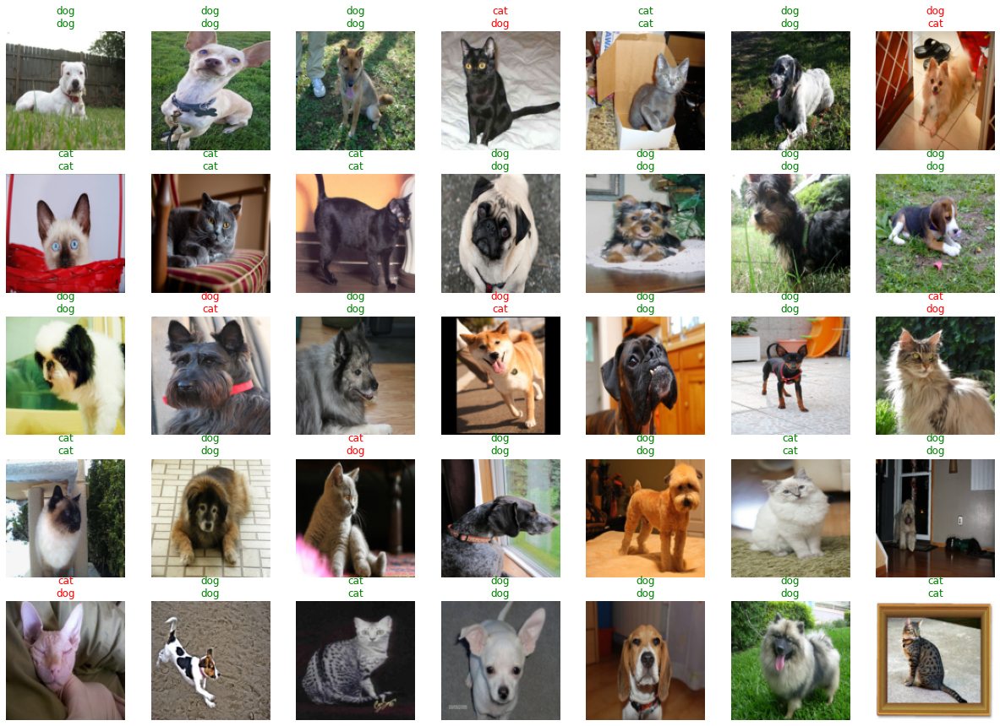

In [ ]:
learn.show_results(max_n=35, dl=test_dl, shuffle=False)

Well, that wasn't a huge improvement, but you should be seeing around 1-3% increase in validation and testing accuracies. You might also see some of the images in the above `.show_results()` output that were previously misclassified are now correctly classified!


Hmmmm, what else can we do to improve our accuracy and loss?

Well, the training duration is definitely a problem. Normally, we'd like to train for many more epochs but due to GPU limitations let's keep training for around ~3 epochs. If you have the time, feel free to train for many more epochs and see how much the validation and testing accuracy improves!

What else? What can we do besides changing the network? Maybe, we just need more data as we only have around ~7000 examples. How can we get more data though? We can't just magically collect more data. This is where data augmentation comes into play!

## Exploring Training With Augmented Data

What is data augmentation? Data augmentation is exactly what it sounds. We simply take the existing images and we augment them in different ways. Doing so creates a new data sample that has been slightly changed. Data augmentation helps us address two main issues ([ref](https://nanonets.com/blog/data-augmentation-how-to-use-deep-learning-when-you-have-limited-data-part-2/)):

1. Lack of data
2. Diversity of data

The first issue arises, well...due to the lack of data of course. Sometimes we don't have enough data and we can't collect more data. One option is to then augment our existing data to produce slightly new data samples. Let's say we have 7000 data samples, if we apply 1 data augmentation to each image we have effectively doubled our data to 14000 samples! As you can see, data augmentation can quickly increase the number of data samples very quickly.

The second issue arise do to not only the lack of data but also due to how clean and curated our data is. Sometimes we can forget that our data is too clean or curated such that when we deploy our algorithm to the real world, where data is much noisier, our algorithm fails horridly. Data augmentation essentially adds "noise" to our data which can help our algorithm learn important features instead of superficial features that are specific to the clean or curated data!

**Note: FastAI refers to data augmentations as transforms so you might see us use the words interchangeably.**

Now, let's explore some different types of data augmentations available to us through FastAI. Since FastAI tries to implement current deep learning trends, they implement most of the augmentations you'll see used in practice.

Let's start by loading a sample image called `img` from our training data. Next, we convert this image into a PyTroch tensor so we can use FastAI's data augmentation API which can compute augmentations on the GPU!

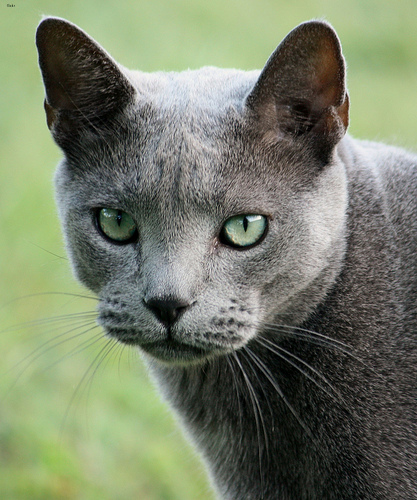

In [ ]:
img = PILImage.create(trn_paths[12])
img

In [ ]:
timg = TensorImage(array(img)).permute(2,0,1).float()/255.
timg.shape

torch.Size([3, 500, 417])

### Rotate

The first type of data augmentation we can use is called rotating. Rotating is simple, all we do is randomly rotate our image between 1 and 359 degrees. Optionally, we can specify the `max_deg` parameter so that our image will randomly rotate only between say 1 and 90 degrees!

The downside of of this method is that it isn't always safe to use. This is because rotations aren't always a "label preserving" augmentation. Take for instance the dataset MNIST, if we rotate a 6 180 degrees it would look like a 9, but since the augmented data adopts the label of the original sample it would still be labeled as a 6! As you will see, which augmentations are safe to apply to your data largely depends on your type of data.

<div id="TODO13"></div>

#### TODO 13

1. Initialize the FastAI `Rotate` class ([docs](https://docs.fast.ai/vision.augment.html#Rotate)) and specify the parameters for setting the max degree and for setting the probability equal to 1 so that the transformation will always be applied. Store the output into `rotate`.
    1.  Run the `doc(Rotate)` or `Rotate?` to see the documentation for `Rotate`.

In [ ]:
# TODO 13.1


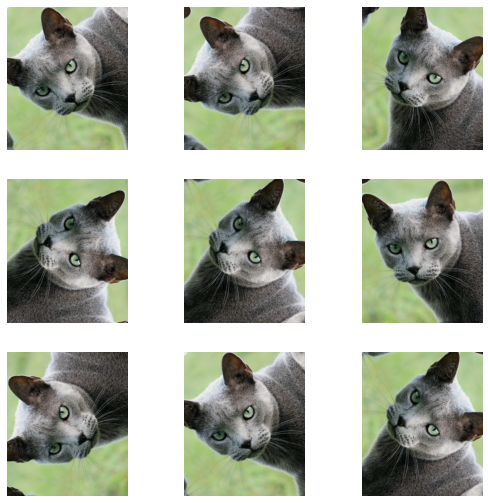

In [ ]:
_,axs = plt.subplots(3,3,figsize=(9,9))
for ax in axs.flatten():
    rotated = rotate(timg.unsqueeze(0), split_idx=0).squeeze()
    show_image(rotated, ctx=ax);

### Crop

The next data augmentation method we can use is called cropping. Cropping crops or selects a random patch of the image. One downside to cropping is that it doesn't necessarily "preserve the label". Meaning, cropping can sometimes focus on an aspect of the image that does not relate to the original image's label. Also, note that cropping changes the size of the image!

<div id="TODO14"></div>

#### TODO 14

1. Initialize the FastAI `RandomResizedCropGPU` class ([docs](https://docs.fast.ai/vision.augment.html#RandomResizedCropGPU)) and specify the size parameter to 256 which sets the size of the crop and for set the probability equal to 1 so that the transformation will always be applied. Store the output into `crop`.
    1.  Run the `doc(RandomResizedCropGPU)` or `RandomResizedCropGPU?` to see the documentation.

In [ ]:
# TODO 14.1


Image shape: torch.Size([3, 256, 256])


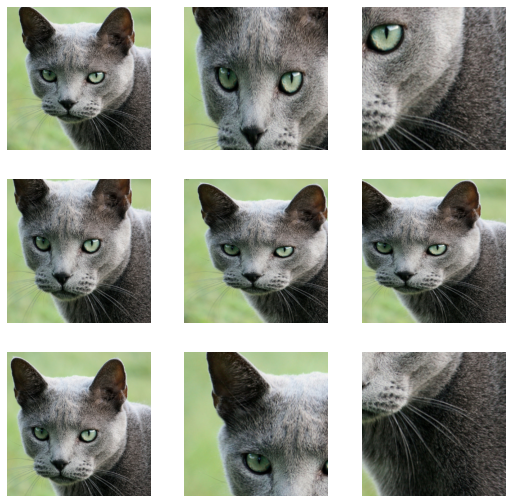

In [ ]:
_,axs = plt.subplots(3,3,figsize=(9,9))
for ax in axs.flatten():
    cropped = crop(timg.unsqueeze(0), split_idx=0).squeeze()
    show_image(cropped, ctx=ax);
print("Image shape: {}".format(cropped.shape))

### Wrapping

Another method for augmenting data is called wrapping ([ref](https://www.kdnuggets.com/2018/05/data-augmentation-deep-learning-limited-data.html)) ([docs](https://docs.fast.ai/vision.augment.html#Warping)). Wrapping attempts to change the perspective of an image. We can set the magnitude or degree of wrapping using the `magnitude` parameter.

The downside of wrapping is that it can produce some weird and unnatural looking images. By default, wrapping uses a method called reflects which reflects the pixels along the image boundary, this tends to be the default mode most applications use (see first example). However, there are other modes like zero padding or constant filling which fill the background with a constant (see second example).  

In [ ]:
wrap = Warp(p=1.0, magnitude=0.4)

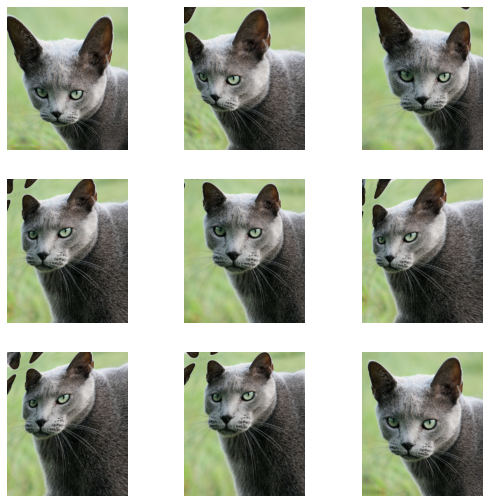

In [ ]:
_,axs = plt.subplots(3,3,figsize=(9,9))
for ax in axs.flatten():
    wrapped = wrap(timg.unsqueeze(0), split_idx=0).squeeze()
    show_image(wrapped, ctx=ax);

An example of the reflection mode using zero padding or a constant filling instead of reflection.

In [ ]:
wrap = Warp(p=1.0, magnitude=0.4, pad_mode='zeros')

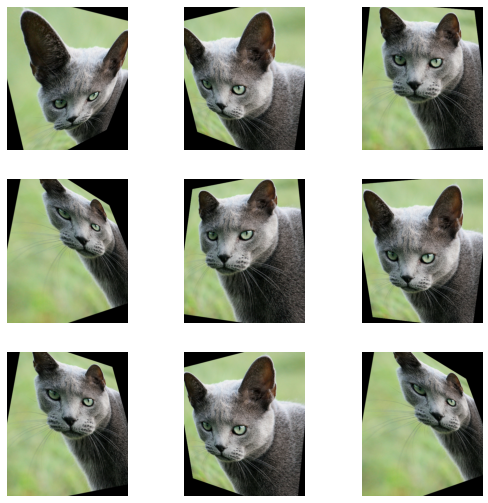

In [ ]:
_,axs = plt.subplots(3,3,figsize=(9,9))
for ax in axs.flatten():
    wrapped = wrap(timg.unsqueeze(0), split_idx=0).squeeze()
    show_image(wrapped, ctx=ax);

### Zoom

The next data augmentation is really straight forward, it is called zoom ([docs](https://docs.fast.ai/vision.augment.html#Zoom)). All zoom does is zoom in on the a random part of the image. The difference between crop and zoom is that zoom maintains the original dimensions of the image! The draw backs of zoom are similar to that of cropping such that it doesn't necessarily "preserve the label" as it can zoom in on unrelated aspects of the image that have nothing to do with the original image's label.

In [ ]:
zoom = Zoom(min_zoom=.9, max_zoom=2, p=1.)

Image shape: torch.Size([3, 500, 417])


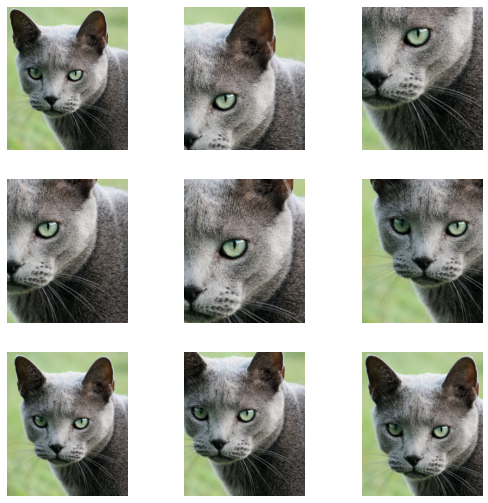

In [ ]:
_,axs = plt.subplots(3,3,figsize=(9,9))
for ax in axs.flatten():
    zoomed = zoom(timg.unsqueeze(0), split_idx=0).squeeze()
    show_image(zoomed, ctx=ax);
print("Image shape: {}".format(zoomed.shape))

### Brightness

Another straight forward augmentation we can do is adjusting the brightness ([docs](https://docs.fast.ai/vision.augment.html#Brightness)). Extreme brightness augmentations can vastly distort images, although they can be semi-representative of potential real world data since we all aren't professional photographers.

In [ ]:
brightness = Brightness(max_lighting=.5, p=1.)

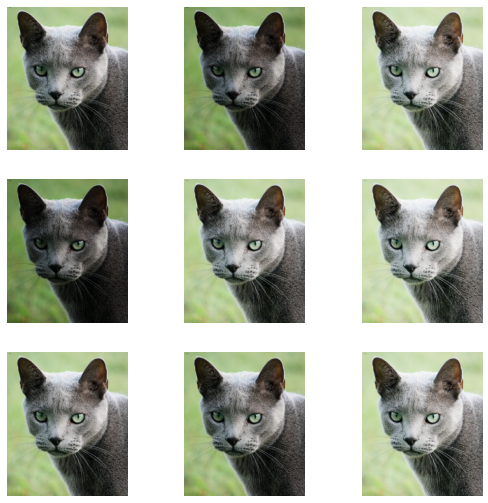

In [ ]:
_,axs = plt.subplots(3,3,figsize=(9,9))
for ax in axs.flatten():
    brightened = brightness(timg.unsqueeze(0), split_idx=0).squeeze()
    show_image(brightened, ctx=ax);

### Contrast

Like brightness, it is also possible to augment the contrast of an image ([docs](https://docs.fast.ai/vision.augment.html#Contrast)). Just like brightness, extreme contrast augmentations can distort our image. When using the contrast augmentation it is important to consider how important color is to your data as well as.

In [ ]:
contrast = Contrast(max_lighting=.5, p=1.)

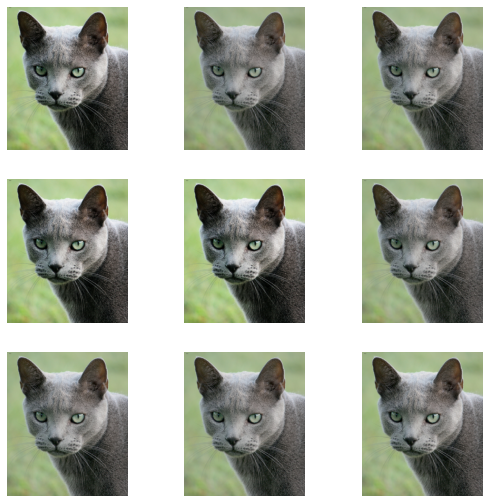

In [ ]:
_,axs = plt.subplots(3,3,figsize=(9,9))
for ax in axs.flatten():
    contrasted = contrast(timg.unsqueeze(0), split_idx=0).squeeze()
    show_image(contrasted, ctx=ax);

### Combining All Transforms

FastAI has a really useful `aug_transforms()` function which generates a list off data augmentations containing the flip, rotate, zoom, warp, lighting transforms (brightness and contrast) we just talked about.


If we want to specify certain parameters such as the probability for applying affine augmentation (in other words flip, wrapping, zoom, rotates, ect), we can use the `p_affine` parameter. On the other hand, if we want to specify the probability for applying light augmentations, we can use set ` p_light` parameter. Likewise, we can specify other parameters such as `max_wrap` which dictates the magnitude of the wrapping or `max_zoom` which dictates the max zoom multiplier.

Feel free to check out the other parameters using the `aug_transforms()` [docs](https://docs.fast.ai/vision.augment#aug_transforms) or check out the source code which is really actual pretty straight forward to read. You can do so by entering `aug_transforms??` into a code cell.

In [ ]:
all_tfms = aug_transforms(max_warp=.3)

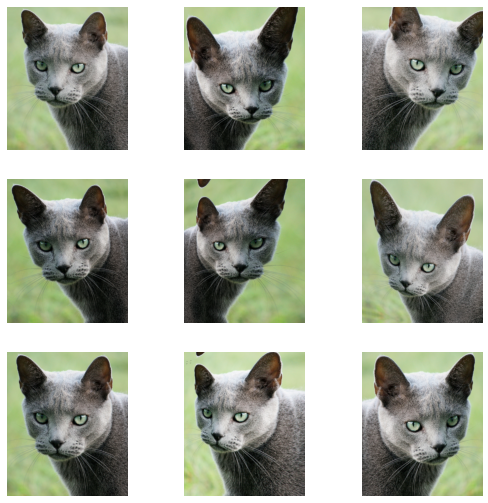

In [ ]:
_,axs = plt.subplots(3,3,figsize=(9,9))
for ax in axs.flatten():
    tfm_img = timg
    for tfm in all_tfms:
        tfm_img = tfm(tfm_img.unsqueeze(0), split_idx=0).squeeze()
    show_image(tfm_img, ctx=ax);

Note that every time we run the above code we should see different augmentations being applied. If you run it enough you should start to see images which contain different augmentations. Further, notice that some of the augmentations are rather subtle while others are more pronounced. Since we are combining so many different augmentations with different probabilities we get a vast number of combinations. Theoretically, we are then vastly expanding our data.

Before moving on I'd just like to note that there are two traditional options for when to apply data augmentations.

- Offline
    - Offline data augmentations means we have some dataset and we apply all our augmentations to the dataset before training. Depending on the amount of augmentations applied and the size of the dataset this can require large amounts of hard drive space.  
- Online
    - Online data augmentations means we have a fixed dataset and every time we draw a mini-batch of data we then apply our augmentations to said mini-batch. This is can slow down training but can really save on hard drive space.
    
The method we are going to use is the online method.

### Reloading PETs Data With Augmentations

<div id="TODO15"></div>

#### TODO 15

Now let's try learning using our newly learned data augmentation methods given by the FastAI `aug_transforms()` function!

1. Create an instance of the `DataBlock()` class like we did in TODO 6. However, now pass the `aug_transforms(max_warp=.3)` function to the `DataBlock` `batch_tfms` parameter. Store the output back into `pet_db`.
    1. Recall that the `max_warp=.3` increases the wrapping magnitude! Also, passing the `aug_transforms(max_warp=.3)` to the `batch_tfms` means that every time we take a mini-batch we will apply the augmentations specified by `aug_transforms()` with some probability.

In [ ]:
# TODO 15.1


In [ ]:
trn_vld_dls = pet_db.dataloaders(trn_paths, bs=128)

We can see our augmentations at work by using the `.show_batch()` method which will show our mini-batch after all the `batch_tfms` have been applied.

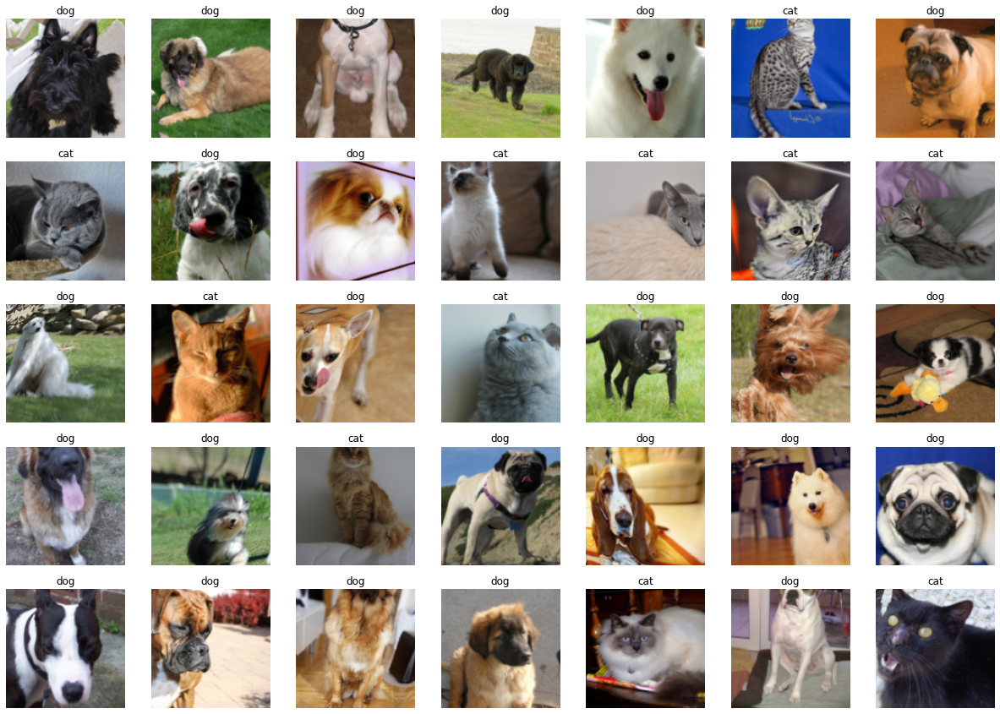

In [ ]:
trn_vld_dls.show_batch(max_n=35)

Notice it can be really hard to see what augmentations are being applied to some images as the augmentations can be quite subtle. Also, since each augmentation has a probability associated with it, we might not always see a certain augmentation. It is also pretty hard to tell if an image is augmented without seeing the original image unless it is an extreme augmentation. If you want, run the above code cell a few times and you'll slowly begin to pick out the images which contain augmentations better.

Next, we can get a random mini-batch from our validation data to confirm **no augmentations** are being applied to the validation data. This is what we want, typically we only apply augmentations to our training data. Luckily, FastAI handles this for us.

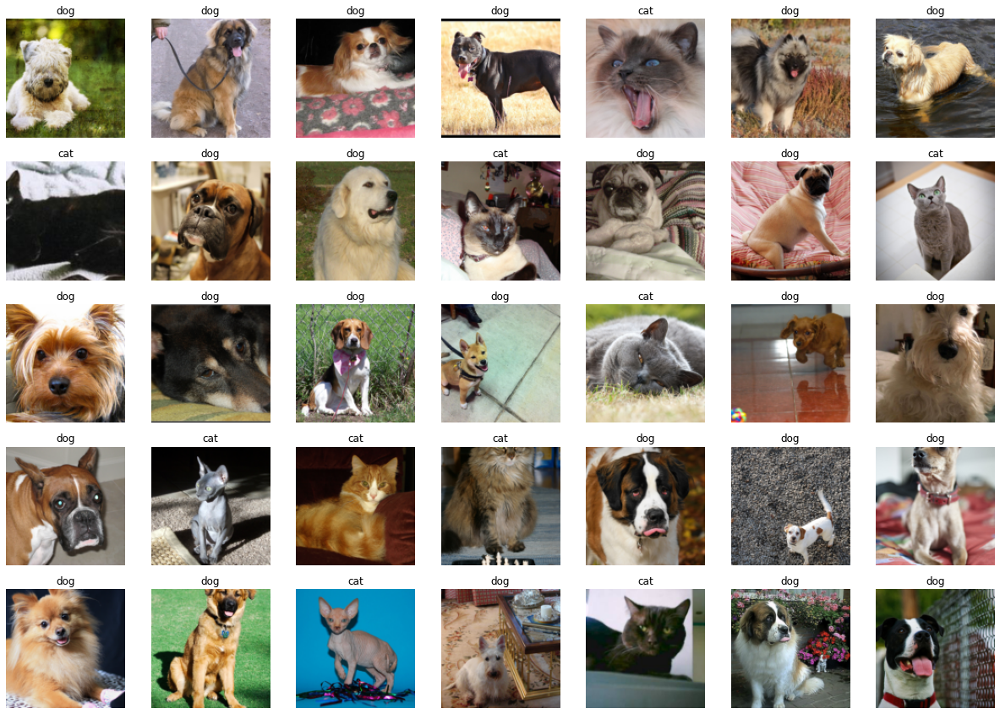

In [ ]:
trn_vld_dls.valid.show_batch(max_n=35)

### Training the CNN

**Warning: This may take a 5+ minutes to run and MUCH longer if you aren't using a GPU.**


Let's train our  Batch Norm CNN again but this time using augmented data.

In [ ]:
nll_loss = BaseLoss(nn.NLLLoss)

def decode_nllloss(x):
    return x.argmax(axis=1)
nll_loss.decodes = decode_nllloss

reset_model(model)
learn = Learner(trn_vld_dls, model, opt_func=Adam, loss_func=nll_loss, metrics=accuracy)

In [ ]:
learn.fit(3, .001)

epoch,train_loss,valid_loss,accuracy,time
0,0.755089,0.629919,0.651880,00:05
1,0.631494,0.616661,0.683459,00:05
2,0.604445,0.557990,0.698496,00:04


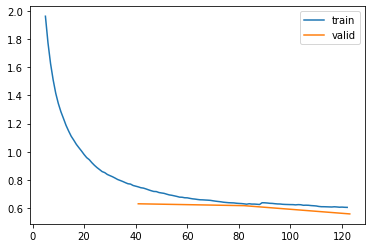

In [ ]:
learn.recorder.plot_loss()

In [ ]:
tst_logprobs, tst_targets = learn.get_preds(dl=test_dl)
tst_loss, tst_acc = learn.validate(dl=test_dl)
tst_preds = tst_logprobs.argmax(axis=1)
print("Test loss: {:.5f} accuracy: {:.5f}".format(tst_loss, tst_acc))

Test loss: 0.54903 accuracy: 0.71854


In [ ]:
tst_incorrect_preds = torch.where((tst_targets == tst_preds) == False)[0]
print("Number of test data samples misclassified: {}".format(len(tst_incorrect_preds)))

Number of test data samples misclassified: 208


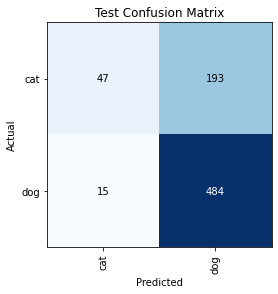

In [ ]:
tst_interp = ClassificationInterpretation.from_learner(learn, dl=test_dl)

tst_interp.plot_confusion_matrix(title="Test Confusion Matrix")

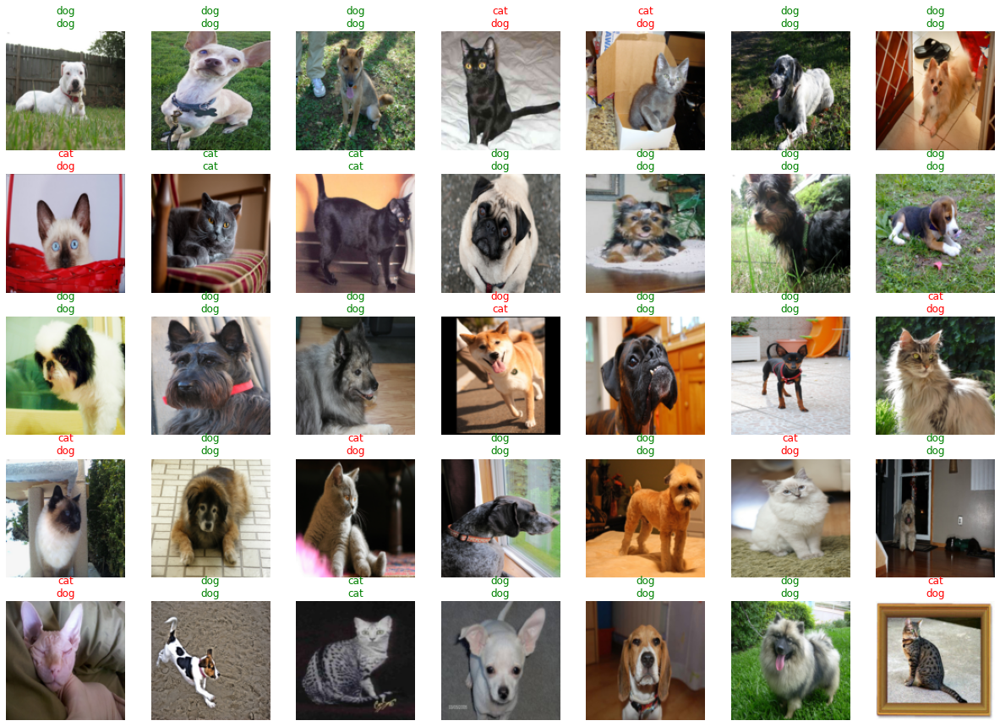

In [ ]:
learn.show_results(max_n=35, dl=test_dl, shuffle=False)

What gives? Why does it seem like our model is performing worse than before? The answer to this question is actually the thing that has been the biggest hurdle for us to overcome in this lab, time.

The issue isn't the augmented data, rather we need more time to train the network. Since we are using augmented data, the network is going to have a harder time learning as each mini-batch presents images with a variable amount of noise (the noise here is the amount of augmentations applied and the severity of the augmentations). While learning may be slower at first it is safe to assume that our training scores in the longer term will actually be better (higher accuracy and lower loss).

If you have the time or computation, try training for many more epochs (10,20,30, ect) and see how low/high you can get the loss/accuracy. You should notice that the loss/accuracy will actual be pretty variable and will fluctuate as training goes on. This is most likely due to that noise we talked about earlier related to the vast variance in augmentations being seen at every mini-batch.

## Transfer Learning With ResNet

What can we do to combat this need for longer training times? The go to answer is usually use someone else's network! So that's what we are going to do. We are going to use one of the most influential CNN models of all time to do all the heavy lifting for us. The best part is, we really don't have to do any training! Actually, you will see shortly that we will get a better accuracy in one epoch than if we trained for many epochs using our simple CNNs.

### What is transfer learning?

The technical term for what we are about to do is called *transfer learning* ([ref](https://ruder.io/transfer-learning/)). Transfer learning can take on many forms, but the form we are going to focus on today is where we take a network that has already been trained on a different dataset and we train it a little bit more using a different, yet similar, dataset.

Utilizing a network that has been trained on a different dataset is often referred to as *pre-training*. When we take a pre-trained network and train it more using a different, yet similar, dataset this is called *fine tuning*.

The catch here is that the dataset used for pre-training must be similar to the dataset we use to fine tune. The greater the difference between the datasets, the worse the pre-trained network will perform and more fine-tuning training will be required. If the datasets are vastly different transfer learning might not even be possible. For instance, if we tried using a network pre-trained on audio for our image classification it wouldn't go too well.

Luckily, we are going to use a CNN called ResNet as our pre-trained model which is trained on an image dataset called ImageNet. ImageNet is a massive dataset containing millions of different images and thousands of classes (ImageNet is image classification problem). This pre-trained ResNet model is one of the go to networks for CNN transfer learning because it has gotten really good at extracting features for images and has already been trained for many, many more hours than we have time for. Additionally, a subset of the ImageNet classes are different cat and dog breeds which means it is even more suited for our transfer learning problem of classifying cats vs dogs!

- References
    - [video] [Transfer Learning (C3W2L07)](https://www.youtube.com/watch?v=yofjFQddwHE)

### Adding a New Head and Freezing Layers

There is two caveats to transfer learning we haven't covered yet: adding a new head and freezing layers.

First, if we are going to take some pre-trained network that is trained on a different dataset with different classes, how do we apply it to a new, yet similar, dataset that might have a different number of classes?

The solution to this problem is often referred to as *adding a new head*. What this means is that we toss out the very last layer of the model, otherwise called the head, which is usually just a fully connected layer where the number of output neurons is equal to the number of classes in dataset used for pre-training. All we have to do now is add a new *head* of the network which is a fully connected layer where the number of output neurons is equal to the number classes in the dataset we will be using for fine-tuning. Now, when we fine-tune we are retraining this head to make predictions for our specific dataset.

Second, when we fine-tune a network we do not typically want to fine-tune ALL the layers in the pre-trained network. Rather we just want to fine tune the head of the network which contains our new output neurons specific to our dataset's classes. To do so, we *freeze* the layers we don't want to fine-tune such that back-propagation doesn't update the weights for these layers.

### Visualizing Transfer Learning

We can see everything we just talked about summed up in a single image. In the below image you can see we train some network on Task A. We then transfer a subset of the layers from Task A to be used in Task B. Notice, in Task B we freeze those transfered layers (i.e., back-propagation doesn't update those transfered layers) and we add a new head (indicated by the purple color) to the network which is then fine-tuned.

<img src="https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fcdn-images-1.medium.com%2Fmax%2F2000%2F1*f2_PnaPgA9iC5bpQaTroRw.png&f=1&nofb=1" width=600 height=600>

### Fine Tuning ResNet

Alright, given this idea of transfer learning let's give it a go. As we mentioned we will using a pre-trained network called ResNet which is pre-trained using the ImageNet dataset (see the What is Transfer Learning section above for more information). Sadly, we don't have the space to talk about ResNet and what it is doing in-depth, but if you are interested you can check out the [paper](https://arxiv.org/abs/1512.03385) or some of the below video references.

A very high-level overview of ResNet is that it introduces a new layer for CNNs called the residual layer or skip connections. All a skip connection layer is doing is passing some input from an earlier layer to a much later layer. It looks something like the below image. By doing this, it actually makes training really deep neural networks much easier!


<img src="https://media.geeksforgeeks.org/wp-content/uploads/20200424011510/Residual-Block.PNG">

- Reference
    - [video][C4W2L03 Resnets](https://www.youtube.com/watch?v=ZILIbUvp5lk)
    - [video][C4W2L04 Why ResNets Work](https://www.youtube.com/watch?v=RYth6EbBUqM)
    - [video][Deep Residual Learning for Image Recognition (Paper Explained)](https://www.youtube.com/watch?v=GWt6Fu05voI)

Let's first start by loading the pre-trained ResNet module. To do so, you might have guessed it, we are going to use a FastAI function which will automatically download the ResNet for us.

Note that ResNet has many different versions. For instance, there is `resnet18`, `resnet34`, `resnet50`, ect. The number on the end of ResNet is referring to how many layers are in that version of the ResNet model. We are going to be working with the medium size version called `resnet34`.

In [ ]:
resnet = resnet34(pretrained=True).to(device)

Next, we get a mini-batch from our `trn_vld_dls` `DataLoaders` instance which contains our augmented Pets dataset and feed it through ResNet to see what the output looks like.

In [ ]:
x, y = trn_vld_dls.one_batch()
resnet_output = resnet(x)
resnet_output.shape

torch.Size([128, 1000])

As we can see the ResNet's output shape is `[128, 1000]` where the 1000 is the number of classes in ImageNet. If we take a closer look using `summary()` we can see the last layer, the head, is a linear layer which has 1000 outputs.

Also note that the `BasicBlock` layers contain the skip connects!

In [ ]:
summary(resnet, x.shape[1:])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           9,408
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
         MaxPool2d-4           [-1, 64, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              ReLU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
       BasicBlock-11           [-1, 64, 32, 32]               0
           Conv2d-12           [-1, 64, 32, 32]          36,864
      BatchNorm2d-13           [-1, 64, 32, 32]             128
             ReLU-14           [-1, 64,

Well, we don't want this layer. We want to add our own head which has 2 outputs since we have 2 classes: cats and dogs! We can easily remove this layer by doing the following.

First, we can get all the layers except the last layer by executing the following line.

In [ ]:
list(resnet.children())[:-1]

[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False),
 BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 ReLU(inplace=True),
 MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False),
 Sequential(
   (0): BasicBlock(
     (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   )
   (1): BasicBlock(
     (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), pad

Next, we can pass all the extracted layers to an `nn.Sequential` and overwrite our `resnet` variable.

In [ ]:
resnet = nn.Sequential(*list(resnet.children())[:-1])

Now, we can check the output and see the we get a different output. Also, if we check the `summary()` function output we can see we no longer have the old network head!

In [ ]:
x, y = trn_vld_dls.one_batch()
resnet_output = resnet(x)
resnet_output.shape

torch.Size([128, 512, 1, 1])

In [ ]:
summary(resnet, x.shape[1:])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           9,408
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
         MaxPool2d-4           [-1, 64, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              ReLU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
       BasicBlock-11           [-1, 64, 32, 32]               0
           Conv2d-12           [-1, 64, 32, 32]          36,864
      BatchNorm2d-13           [-1, 64, 32, 32]             128
             ReLU-14           [-1, 64,

<div id="TODO16"></div>

Now, we need to define a new head layer that is specific for our network.

#### TODO 16

Define our new head layer by following the below instructions.

1. Define an PyTorch neural network using the `nn.Sequential` and store the output into `fc_layers`. Be sure to move the model to the correct device using `.to(device)`. Within the `nn.Sequential()` add the following layers:
    1. Define a `nn.Flatten` layer to flatten the output of the ResNet model.
    2. Define a `nn.Linear` layer with  `in_features` equal to the output of the ResNet model and `out_features=2` parameter.
        1. Hint: See the above 4 dimensional output from `resnet_output` which was `[128, 512, 1, 1]` and recall how `nn.Flatten` flattens the last 3 dimensions! Doing so will then give you the number of `in_features`.
    3. Lastly, Define a `nn.LogSoftmax` activation.

In [ ]:
# TODO 16-1


Alright, all we need to do is combine the ResNet layers and our head network by passing them to a `nn.Sequential`. Notice, we do something different here. PyTorch allows you to label parameter groups or groups of layers by adding your layers to an `OrderedDict` and giving each grouping of layers a name. We will see why we did this in a second, but it relates to how we freeze layers when using FastAI.

In [ ]:
model = nn.Sequential(OrderedDict([('feature_extractor', resnet),
                                       ('classifier', fc_layers)]))

Next, you can check if you defined the head layers correctly by passing a batch of augmented data through our network. You should see an output of `[128, 2]`.

In [ ]:
x, y = trn_vld_dls.one_batch()
model_output = model(x)
model_output.shape

torch.Size([128, 2])

Further, we check `summary()` function output to see our custom head has been added!

In [ ]:
summary(model, x.shape[1:])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           9,408
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
         MaxPool2d-4           [-1, 64, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              ReLU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
       BasicBlock-11           [-1, 64, 32, 32]               0
           Conv2d-12           [-1, 64, 32, 32]          36,864
      BatchNorm2d-13           [-1, 64, 32, 32]             128
             ReLU-14           [-1, 64,

Next, we can define our loss and `Learner` just like before! However, notice that we are doing something slightly different. We are passing some `resnet_splitter` function. All this function is doing is telling FastAI how to split our network into two different groups.

The first group we defined as the ResNet layers and called it "feature_extractor" when we passed it to our model above. The second group we defined as the full connected layers or our head and called it "classifier". By doing so, when we go to freeze our network FastAI will freezes all the layers except the last group. By splitting our model into two groups we only freeze the first group, in other words the fully connected layers or head will not be frozen. If we didn't do this FastAI would freeze all our layers because we never specified any groupings!

In [ ]:
# Define loss
nll_loss = BaseLoss(nn.NLLLoss)

def decode_nllloss(x):
    return x.argmax(axis=1)
nll_loss.decodes = decode_nllloss

# Define a splitter for splitting our
# resnet and full connecter layers into two different
# parameter groups
from collections import OrderedDict

def resnet_splitter(model):
    def params(m):
        return [p for p in m.parameters()]
    return [params(model.feature_extractor), params(model.classifier)]


learn = Learner(trn_vld_dls,
                model,
                opt_func=Adam,
                loss_func=nll_loss,
                metrics=accuracy,
                splitter=resnet_splitter)

To freeze our layers we can use the `learn.freeze()` method which will freeze all layers except for layers in the last group we just defined.

In [ ]:
learn.freeze()

We can confirm our freezing work by using `learn.summary()`. If we look at the "Trainable" column we can see all layers except our last layer are frozen. Wait a second, why are all the `BatchNorm2d` layers in ResNet not frozen???

Research has shown it is actually best to leave the `BatchNorm2d` layers unfrozen. Doing so allows the `BatchNorm2d` layers to adapt to the new mean and standard deviation of our new data. So, that's what FastAI does by default.

Also note that the total trainable parameters is only around ~18k while the total parameters is around ~21 million!

In [ ]:
learn.summary()

Sequential (Input shape: 128)
Layer (type)         Output Shape         Param #    Trainable 
                     128 x 64 x 64 x 64  
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                     

Let's finally fine-tune our ResNet model!

**WARNING: Every time you run the below Learner cell below be sure to rerun the above code cells which define your model (all the cells in the Fine Tuning ResNet section) otherwise you will continue learning from where you left off!!!**

In [ ]:
learn.fit(3, .001)

epoch,train_loss,valid_loss,accuracy,time
0,0.263273,0.097857,0.966165,00:06
1,0.143076,0.070395,0.972932,00:05
2,0.099769,0.055134,0.979699,00:05


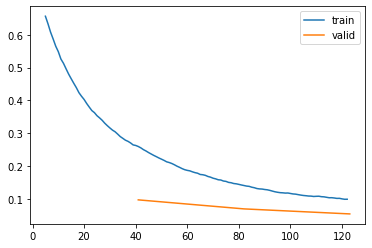

In [ ]:
learn.recorder.plot_loss()

In [ ]:
tst_logprobs, tst_targets = learn.get_preds(dl=test_dl)
tst_loss, tst_acc = learn.validate(dl=test_dl)
tst_preds = tst_logprobs.argmax(axis=1)
print("Test loss: {:.5f} accuracy: {:.5f}".format(tst_loss, tst_acc))

Test loss: 0.06622 accuracy: 0.97564


In [ ]:
tst_incorrect_preds = torch.where((tst_targets == tst_preds) == False)[0]
print("Number of test data samples misclassified: {}".format(len(tst_incorrect_preds)))

Number of test data samples misclassified: 18


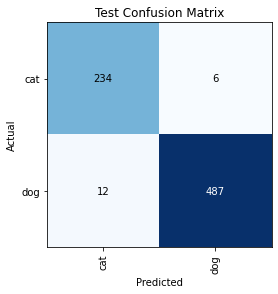

In [ ]:
tst_interp = ClassificationInterpretation.from_learner(learn, dl=test_dl)

tst_interp.plot_confusion_matrix(title="Test Confusion Matrix")

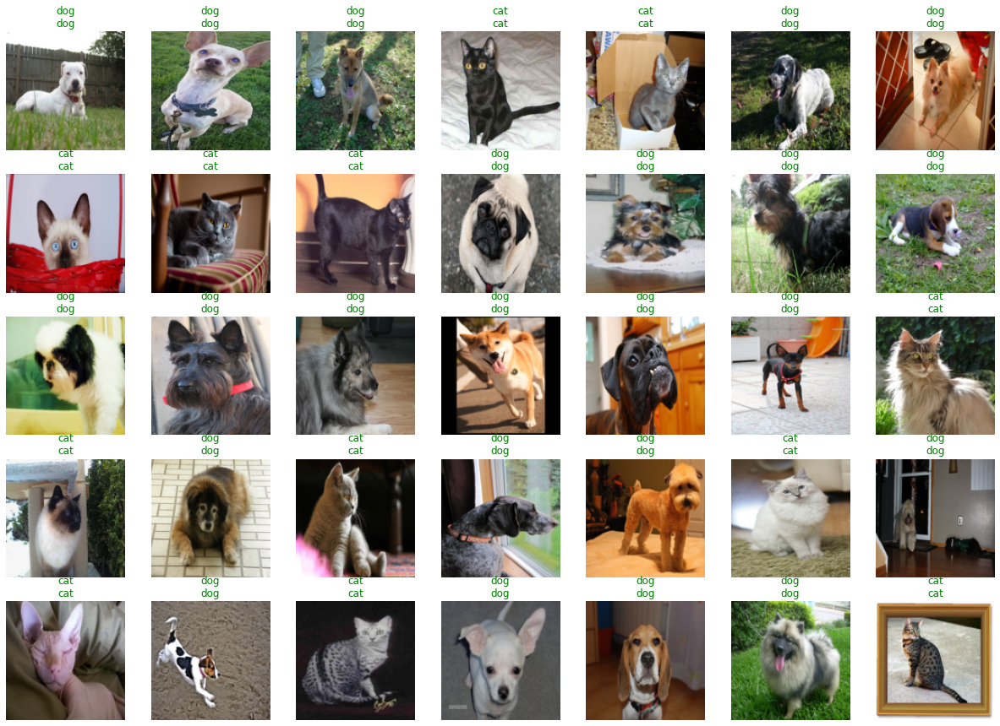

In [ ]:
learn.show_results(max_n=35, dl=test_dl, shuffle=False)

Wow, look at that! Our validation and test accuracy are almost 20% higher than before! This is the power of using a pre-trained and very deep CNN! Within 1 epoch we have gotten the highest accuracy we have seen so far. Look at how few samples we are misclassifying in the confusion matrix as well. This really was a massive improvement to performance and required practically no time, well none of our time at least!

On that note, we will conclude this lab! Please do leave feedback below so we can improve this lab for future students!

<div id="feedback"></div>

# Feedback TODO (2 point)

Did you enjoy the lab?

Please take time to answer the following feedback qustions to help us further improve these labs! Your feedback is crucial to making these labs more useful!
    

* How do you rate the overall experience in this lab? (5 likert scale. i.e., 1 - poor ... 5 - amazing)  
Why do you think so? What was most/least useful?

`ANSWER`

* What did you find difficult about the lab? Were there any TODOs that were unclear? If so, what specfically did not make sense about it?

`ANSWER`

* Which concepts, if any, within the lab do you feel could use more explanation?

`ANSWER`